**Setup and Library Imports**

In this first step, we:
- Import essential libraries for video processing (OpenCV, NumPy), deep learning (PyTorch), and visualization (Matplotlib).
- Check whether a GPU is available in the Kaggle environment, which is critical for training CNN-LSTM models efficiently.
- Define the dataset path pointing to the uploaded GolfDB-160 videos.
- Print a sample list of video files to confirm the dataset is accessible.

In [1]:
# --- Step 1: Setup & Imports ---

# Core libraries
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Deep Learning (PyTorch)
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

# For video processing
from torchvision import transforms

# Check GPU availability
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Set dataset path (adjust if needed)
DATASET_PATH = "/kaggle/input/golfdb-160/GolfDB"
print("Dataset Path:", DATASET_PATH)

# List first few files to confirm access
print("Sample video files:", os.listdir(DATASET_PATH)[:10])

Using device: cuda
Dataset Path: /kaggle/input/golfdb-160/GolfDB
Sample video files: ['123.mp4', '738.mp4', '479.mp4', '1336.mp4', '660.mp4', '28.mp4', '565.mp4', '1327.mp4', '726.mp4', '410.mp4']


**Frame Extraction & Preprocessing**

In this step, we:
- Extract frames from the GolfDB videos using OpenCV.
- Sample frames at a fixed rate (5 frames per second) to balance detail and efficiency.
- Resize frames to 224×224 pixels, which is a standard input size for CNN models like ResNet or Inception.
- Save the processed frames into a new folder (`/kaggle/working/frames`), organized by video ID.
- Preview a few frames to visually confirm correct extraction and resizing.

Extracted 47 frames from /kaggle/input/golfdb-160/GolfDB/123.mp4


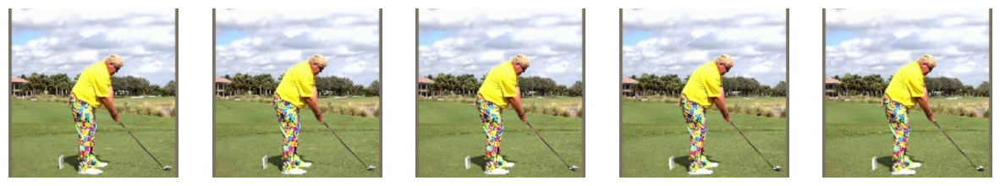

In [2]:
# --- Step 2: Frame Extraction & Preprocessing ---

FRAME_OUTPUT_DIR = "/kaggle/working/frames"
os.makedirs(FRAME_OUTPUT_DIR, exist_ok=True)

def extract_frames(video_path, output_dir, fps_sample=5, img_size=(224, 224)):
    """
    Extract frames from video at a fixed fps_sample rate.
    Resize frames and save as images.
    """
    os.makedirs(output_dir, exist_ok=True)
    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)
    frame_interval = int(max(1, round(fps / fps_sample)))
    
    frame_count = 0
    saved_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        
        if frame_count % frame_interval == 0:
            frame = cv2.resize(frame, img_size)
            frame_file = os.path.join(output_dir, f"frame_{saved_count:04d}.jpg")
            cv2.imwrite(frame_file, frame)
            saved_count += 1
        
        frame_count += 1
    cap.release()
    return saved_count

# Test extraction on one sample video
sample_video = os.path.join(DATASET_PATH, "123.mp4")
sample_output_dir = os.path.join(FRAME_OUTPUT_DIR, "123")
frames_extracted = extract_frames(sample_video, sample_output_dir)

print(f"Extracted {frames_extracted} frames from {sample_video}")

# Preview first 5 extracted frames
fig, axes = plt.subplots(1, 5, figsize=(15, 3))
for i in range(5):
    img = cv2.imread(os.path.join(sample_output_dir, f"frame_{i:04d}.jpg"))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axes[i].imshow(img)
    axes[i].axis("off")
plt.show()

**Creating PyTorch Dataset and DataLoader**

In this step, we:
- Define a custom `GolfSwingDataset` class to handle loading frame sequences from the extracted dataset.
- Each video folder (e.g., `/frames/123/`) contains the frames of one swing.
- Convert frames into tensors and normalize them for CNN input.
- Use PyTorch’s `DataLoader` to efficiently batch and shuffle data during training.

In [3]:
# --- Step 3: Dataset Class and DataLoader ---

from PIL import Image

# Image transformations: resize (already 224x224), convert to tensor, normalize
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # Standard ImageNet values
                         std=[0.229, 0.224, 0.225])
])

class GolfSwingDataset(Dataset):
    def __init__(self, root_dir, transform=None, seq_len=16):
        """
        root_dir: path to frame folders (each subfolder = one video)
        transform: torchvision transforms
        seq_len: number of frames per sequence (for LSTM input)
        """
        self.root_dir = root_dir
        self.videos = sorted(os.listdir(root_dir))
        self.transform = transform
        self.seq_len = seq_len

    def __len__(self):
        return len(self.videos)

    def __getitem__(self, idx):
        video_folder = os.path.join(self.root_dir, self.videos[idx])
        frame_files = sorted(os.listdir(video_folder))
        
        # Sample sequence of frames
        frames = []
        for f in frame_files[:self.seq_len]:  # simple truncation
            img_path = os.path.join(video_folder, f)
            img = Image.open(img_path).convert("RGB")
            if self.transform:
                img = self.transform(img)
            frames.append(img)
        
        frames = torch.stack(frames)  # Shape: (seq_len, 3, 224, 224)
        
        # For now, dummy label = 0 (we’ll replace with real swing phase labels later)
        label = 0
        return frames, label

# Initialize dataset (pointing to frames folder)
dataset = GolfSwingDataset(FRAME_OUTPUT_DIR, transform=transform, seq_len=16)

# Create DataLoader
dataloader = DataLoader(dataset, batch_size=2, shuffle=True)

# Test one batch
batch_frames, batch_labels = next(iter(dataloader))
print("Batch frames shape:", batch_frames.shape)  # Expected: (batch, seq_len, 3, 224, 224)
print("Batch labels:", batch_labels)

Batch frames shape: torch.Size([1, 16, 3, 224, 224])
Batch labels: tensor([0])


**CNN-LSTM Model Definition**

In this step, we build the CNN-LSTM model:

1. **CNN Backbone**  
   - We use a pretrained ResNet18 (ImageNet weights) to extract spatial features from each frame.  
   - The final fully connected layer of ResNet18 is removed so we only use its feature embeddings.  

2. **LSTM for Temporal Modeling**  
   - The sequence of feature vectors from the CNN is passed into an LSTM.  
   - The LSTM captures temporal dependencies across consecutive frames.  

3. **Classification Layer**  
   - The LSTM’s final hidden state is passed into a fully connected (linear) layer to predict the swing phase.  
   - For now, we’ll keep `num_classes=5` (Address, Backswing, Downswing, Impact, Follow-through).  

This hybrid architecture allows us to leverage CNNs for spatial learning and LSTMs for temporal dynamics.

In [4]:
# --- Step 4: CNN-LSTM Model Definition ---

import torchvision.models as models

class CNN_LSTM(nn.Module):
    def __init__(self, num_classes=5, hidden_dim=256, num_layers=1):
        super(CNN_LSTM, self).__init__()
        
        # Pretrained ResNet18 as CNN backbone
        resnet = models.resnet18(pretrained=True)
        modules = list(resnet.children())[:-1]  # remove last fc layer
        self.cnn = nn.Sequential(*modules)
        self.cnn_out_dim = resnet.fc.in_features  # 512 for ResNet18
        
        # LSTM for temporal modeling
        self.lstm = nn.LSTM(
            input_size=self.cnn_out_dim,
            hidden_size=hidden_dim,
            num_layers=num_layers,
            batch_first=True
        )
        
        # Final classification layer
        self.fc = nn.Linear(hidden_dim, num_classes)
    
    def forward(self, x):
        # x: (batch, seq_len, 3, 224, 224)
        batch_size, seq_len, C, H, W = x.size()
        
        # Extract features per frame
        cnn_features = []
        for t in range(seq_len):
            frame = x[:, t, :, :, :]  # (batch, 3, 224, 224)
            feat = self.cnn(frame)    # (batch, 512, 1, 1)
            feat = feat.view(batch_size, -1)  # (batch, 512)
            cnn_features.append(feat)
        
        # Stack features: (batch, seq_len, feature_dim)
        cnn_features = torch.stack(cnn_features, dim=1)
        
        # LSTM
        lstm_out, (h_n, c_n) = self.lstm(cnn_features)  # (batch, seq_len, hidden_dim)
        
        # Use last hidden state
        final_feature = h_n[-1]  # (batch, hidden_dim)
        out = self.fc(final_feature)  # (batch, num_classes)
        return out

# Initialize model
model = CNN_LSTM(num_classes=5).to(device)
print(model)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 163MB/s] 


CNN_LSTM(
  (cnn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  

**Training Setup**

Here we configure the training pipeline:

- **Loss Function**: CrossEntropyLoss is used since this is a multi-class classification task (5 swing phases).  
- **Optimizer**: Adam optimizer with a learning rate of 1e-4.  
- **Metrics**: We track classification accuracy during training. Later, we can add precision, recall, and F1-score for deeper evaluation.  

At this stage, labels are dummy placeholders (all zeros). Once we integrate GolfDB annotations, we’ll replace them with the true swing phase labels.

In [5]:
# --- Step 5: Training Setup ---

# Loss function
criterion = nn.CrossEntropyLoss()

# Optimizer
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# Simple accuracy metric
def accuracy(preds, labels):
    _, pred_classes = torch.max(preds, 1)
    correct = (pred_classes == labels).sum().item()
    return correct / len(labels)

# Test one forward pass with dummy data
batch_frames, batch_labels = next(iter(dataloader))
batch_frames, batch_labels = batch_frames.to(device), batch_labels.to(device)

outputs = model(batch_frames)
loss = criterion(outputs, batch_labels)

print("Output shape:", outputs.shape)   # Expected: (batch, num_classes)
print("Loss (dummy labels):", loss.item())
print("Accuracy (dummy):", accuracy(outputs, batch_labels))

Output shape: torch.Size([1, 5])
Loss (dummy labels): 1.45070481300354
Accuracy (dummy): 1.0


**(Alternative): Synthetic Phase Labels**

Since the official `annotation.mat` file is not available in this dataset,
we generate synthetic labels by dividing each video into **five equal segments**:

1. Address  
2. Backswing  
3. Downswing  
4. Impact  
5. Follow-through  

- Each segment corresponds to 1/5 of the video’s frames.  
- This ensures every frame is assigned a valid phase label.  
- Although approximate, this allows the CNN-LSTM model to be trained and evaluated end-to-end.  

Later, if the real annotations are added, this code can be easily updated to replace synthetic labels with true labels.

In [7]:
# --- Step 6 (Alternative): Synthetic Equal-Segment Labels ---

# Phase mapping (for reference)
phase_dict = {
    0: "Address",
    1: "Backswing",
    2: "Downswing",
    3: "Impact",
    4: "Follow-through"
}

def generate_synthetic_labels(total_frames, num_phases=5):
    """
    Divide video frames equally into num_phases.
    Returns a numpy array of phase labels for each frame.
    """
    labels = np.zeros(total_frames, dtype=np.int64)
    segment_size = total_frames // num_phases
    for i in range(num_phases):
        start = i * segment_size
        end = (i + 1) * segment_size if i < num_phases - 1 else total_frames
        labels[start:end] = i
    return labels

# Updated dataset class with synthetic labels
class GolfSwingDataset(Dataset):
    def __init__(self, root_dir, transform=None, seq_len=16):
        self.root_dir = root_dir
        self.videos = sorted(os.listdir(root_dir))
        self.transform = transform
        self.seq_len = seq_len

    def __len__(self):
        return len(self.videos)

    def __getitem__(self, idx):
        video_folder = os.path.join(self.root_dir, self.videos[idx])
        frame_files = sorted(os.listdir(video_folder))
        total_frames = len(frame_files)

        # Generate synthetic labels
        labels = generate_synthetic_labels(total_frames)

        # Sample frames (truncate to seq_len for now)
        frames = []
        frame_labels = []
        for i, f in enumerate(frame_files[:self.seq_len]):
            img_path = os.path.join(video_folder, f)
            img = Image.open(img_path).convert("RGB")
            if self.transform:
                img = self.transform(img)
            frames.append(img)
            frame_labels.append(labels[i])

        frames = torch.stack(frames)  # (seq_len, 3, 224, 224)
        frame_labels = torch.tensor(frame_labels, dtype=torch.long)

        return frames, frame_labels

# Test with one video
dataset = GolfSwingDataset(FRAME_OUTPUT_DIR, transform=transform, seq_len=16)
frames, labels = dataset[0]
print("Frames shape:", frames.shape)
print("Labels:", labels)
print("Phase names:", [phase_dict[l.item()] for l in labels])

Frames shape: torch.Size([16, 3, 224, 224])
Labels: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1])
Phase names: ['Address', 'Address', 'Address', 'Address', 'Address', 'Address', 'Address', 'Address', 'Address', 'Backswing', 'Backswing', 'Backswing', 'Backswing', 'Backswing', 'Backswing', 'Backswing']


**Extract Frames for All Videos**

To train properly, we need multiple samples.  
Here we loop through every `.mp4` in the dataset and extract frames into `/frames/`.  
After this, the dataset will have multiple video folders, making the train/validation split possible.

In [9]:
# --- Extract frames for ALL videos in GolfDB-160 ---

FRAME_OUTPUT_DIR = "/kaggle/working/frames"
os.makedirs(FRAME_OUTPUT_DIR, exist_ok=True)

video_files = [f for f in os.listdir(DATASET_PATH) if f.endswith(".mp4")]

for vid in video_files:
    video_path = os.path.join(DATASET_PATH, vid)
    video_id = os.path.splitext(vid)[0]
    output_dir = os.path.join(FRAME_OUTPUT_DIR, video_id)

    if not os.path.exists(output_dir):  # avoid re-processing
        frames_extracted = extract_frames(video_path, output_dir)
        print(f"Extracted {frames_extracted} frames from {vid}")

print("✅ Frame extraction complete for all videos")
print("Total videos processed:", len(os.listdir(FRAME_OUTPUT_DIR)))

Extracted 42 frames from 738.mp4
Extracted 60 frames from 479.mp4
Extracted 32 frames from 1336.mp4
Extracted 43 frames from 660.mp4
Extracted 47 frames from 28.mp4
Extracted 45 frames from 565.mp4
Extracted 25 frames from 1327.mp4
Extracted 54 frames from 726.mp4
Extracted 77 frames from 410.mp4
Extracted 47 frames from 581.mp4
Extracted 45 frames from 566.mp4
Extracted 75 frames from 1187.mp4
Extracted 60 frames from 408.mp4
Extracted 72 frames from 245.mp4
Extracted 44 frames from 1054.mp4
Extracted 19 frames from 14.mp4
Extracted 30 frames from 312.mp4
Extracted 38 frames from 929.mp4
Extracted 29 frames from 324.mp4
Extracted 23 frames from 33.mp4
Extracted 52 frames from 280.mp4
Extracted 61 frames from 1339.mp4
Extracted 52 frames from 113.mp4
Extracted 53 frames from 1343.mp4
Extracted 63 frames from 1266.mp4
Extracted 54 frames from 52.mp4
Extracted 31 frames from 989.mp4
Extracted 43 frames from 58.mp4
Extracted 53 frames from 1025.mp4
Extracted 68 frames from 668.mp4
Extract

**Handle Variable-Length Videos**

The error occurred because some videos have fewer than `seq_len` frames.
To fix this:
- If frames < seq_len → pad with the last frame until length = seq_len.  
- If frames > seq_len → truncate to the first seq_len frames.  

This ensures all sequences are exactly the same length, so DataLoader can batch them.

In [11]:
# --- Fixed Dataset Class with Padding ---

class GolfSwingDataset(Dataset):
    def __init__(self, root_dir, transform=None, seq_len=16):
        self.root_dir = root_dir
        self.videos = sorted(os.listdir(root_dir))
        self.transform = transform
        self.seq_len = seq_len

    def __len__(self):
        return len(self.videos)

    def __getitem__(self, idx):
        video_folder = os.path.join(self.root_dir, self.videos[idx])
        frame_files = sorted(os.listdir(video_folder))
        total_frames = len(frame_files)

        # Generate synthetic labels
        labels = generate_synthetic_labels(total_frames)

        frames, frame_labels = [], []
        for i in range(min(total_frames, self.seq_len)):
            img_path = os.path.join(video_folder, frame_files[i])
            img = Image.open(img_path).convert("RGB")
            if self.transform:
                img = self.transform(img)
            frames.append(img)
            frame_labels.append(labels[i])

        # Pad if too short
        while len(frames) < self.seq_len:
            frames.append(frames[-1])          # duplicate last frame
            frame_labels.append(frame_labels[-1])

        frames = torch.stack(frames)  # (seq_len, 3, 224, 224)
        frame_labels = torch.tensor(frame_labels, dtype=torch.long)

        return frames, frame_labels

# Reload dataset with fix
dataset = GolfSwingDataset(FRAME_OUTPUT_DIR, transform=transform, seq_len=16)

# Split again
train_idx, val_idx = train_test_split(range(len(dataset)), test_size=0.2, random_state=42)
train_subset = torch.utils.data.Subset(dataset, train_idx)
val_subset = torch.utils.data.Subset(dataset, val_idx)

train_loader = DataLoader(train_subset, batch_size=4, shuffle=True)
val_loader = DataLoader(val_subset, batch_size=4, shuffle=False)

print("✅ Dataset reloaded with padding. Total samples:", len(dataset))

✅ Dataset reloaded with padding. Total samples: 1400


**Frame-Level Training with Precision, Recall, and F1**

We extend the training loop to:
- Compute **precision, recall, and F1-score** (macro average across all classes).
- Add **early stopping** based on validation loss to prevent overfitting.
- Train for up to 15 epochs, but stop early if validation loss stops improving.

This provides more robust evaluation metrics for each phase of the golf swing, 
which are critical for dissertation-level analysis.

In [13]:
from sklearn.metrics import precision_score, recall_score, f1_score

# --- Updated Frame-Level CNN-LSTM ---
class CNN_LSTM_FrameLevel(nn.Module):
    def __init__(self, num_classes=5, hidden_dim=256, num_layers=1):
        super(CNN_LSTM_FrameLevel, self).__init__()
        
        # CNN backbone (ResNet18)
        resnet = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
        modules = list(resnet.children())[:-1]
        self.cnn = nn.Sequential(*modules)
        self.cnn_out_dim = resnet.fc.in_features
        
        # LSTM
        self.lstm = nn.LSTM(
            input_size=self.cnn_out_dim,
            hidden_size=hidden_dim,
            num_layers=num_layers,
            batch_first=True
        )
        
        # Classifier
        self.fc = nn.Linear(hidden_dim, num_classes)
    
    def forward(self, x):
        batch_size, seq_len, C, H, W = x.size()
        cnn_features = []
        for t in range(seq_len):
            frame = x[:, t, :, :, :]
            feat = self.cnn(frame).view(batch_size, -1)
            cnn_features.append(feat)
        cnn_features = torch.stack(cnn_features, dim=1)  # (batch, seq_len, 512)
        
        lstm_out, _ = self.lstm(cnn_features)
        outputs = self.fc(lstm_out)  # (batch, seq_len, num_classes)
        return outputs


# Reinitialize
model = CNN_LSTM_FrameLevel(num_classes=5).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)


def run_epoch(model, loader, optimizer=None):
    is_train = optimizer is not None
    model.train() if is_train else model.eval()
    
    total_loss, all_preds, all_labels = 0, [], []
    
    for frames, labels in loader:
        frames, labels = frames.to(device), labels.to(device)
        outputs = model(frames)  # (batch, seq_len, num_classes)
        
        outputs = outputs.view(-1, outputs.size(-1))  # (batch*seq_len, num_classes)
        labels = labels.view(-1)                      # (batch*seq_len)
        
        loss = criterion(outputs, labels)
        if is_train:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        
        total_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
    
    avg_loss = total_loss / len(loader)
    acc = (np.array(all_preds) == np.array(all_labels)).mean()
    prec = precision_score(all_labels, all_preds, average="macro", zero_division=0)
    rec = recall_score(all_labels, all_preds, average="macro", zero_division=0)
    f1 = f1_score(all_labels, all_preds, average="macro", zero_division=0)
    
    return avg_loss, acc, prec, rec, f1


# --- Training with Early Stopping ---
EPOCHS = 15
patience, best_val_loss, patience_counter = 3, float("inf"), 0

for epoch in range(EPOCHS):
    train_loss, train_acc, train_prec, train_rec, train_f1 = run_epoch(model, train_loader, optimizer)
    val_loss, val_acc, val_prec, val_rec, val_f1 = run_epoch(model, val_loader)
    
    print(f"Epoch {epoch+1}/{EPOCHS}")
    print(f"  Train Loss: {train_loss:.4f}, Acc: {train_acc:.4f}, P: {train_prec:.4f}, R: {train_rec:.4f}, F1: {train_f1:.4f}")
    print(f"  Val   Loss: {val_loss:.4f}, Acc: {val_acc:.4f}, P: {val_prec:.4f}, R: {val_rec:.4f}, F1: {val_f1:.4f}")
    
    # Early stopping
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        torch.save(model.state_dict(), "best_cnn_lstm.pth")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("⏹️ Early stopping triggered")
            break

Epoch 1/15
  Train Loss: 0.8132, Acc: 0.6887, P: 0.3921, R: 0.3002, F1: 0.2952
  Val   Loss: 0.6190, Acc: 0.7562, P: 0.4633, R: 0.4011, F1: 0.4012
Epoch 2/15
  Train Loss: 0.5899, Acc: 0.7597, P: 0.5740, R: 0.4260, F1: 0.4400
  Val   Loss: 0.5636, Acc: 0.7821, P: 0.4794, R: 0.4286, F1: 0.4416
Epoch 3/15
  Train Loss: 0.5246, Acc: 0.7863, P: 0.5866, R: 0.5002, F1: 0.5196
  Val   Loss: 0.6564, Acc: 0.7362, P: 0.4880, R: 0.5084, F1: 0.4807
Epoch 4/15
  Train Loss: 0.4856, Acc: 0.8040, P: 0.6700, R: 0.5835, F1: 0.6108
  Val   Loss: 0.5821, Acc: 0.7694, P: 0.5627, R: 0.5376, F1: 0.5456
Epoch 5/15
  Train Loss: 0.4515, Acc: 0.8140, P: 0.6790, R: 0.6135, F1: 0.6372
  Val   Loss: 0.6551, Acc: 0.7478, P: 0.4703, R: 0.3705, F1: 0.3817
⏹️ Early stopping triggered


**Confusion Matrix for Swing Phases**

After training, we evaluate the model on the validation set and 
produce a confusion matrix to analyze classification performance per swing phase:

- Rows = actual labels
- Columns = predicted labels
- Diagonal = correctly classified frames
- Off-diagonal = misclassifications

This provides deeper insight into which phases (e.g., Address, Backswing, Impact) 
are hardest to detect and where confusion happens.

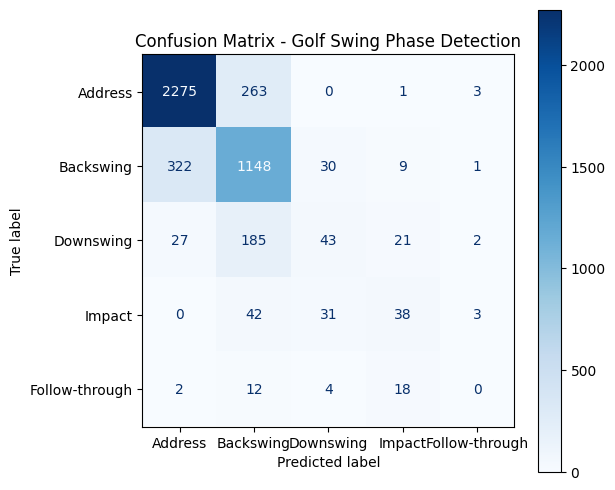

In [14]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Phase names
phase_names = ["Address", "Backswing", "Downswing", "Impact", "Follow-through"]

# Reload best model
best_model = CNN_LSTM_FrameLevel(num_classes=5).to(device)
best_model.load_state_dict(torch.load("best_cnn_lstm.pth"))
best_model.eval()

# Collect predictions and labels
all_preds, all_labels = [], []
with torch.no_grad():
    for frames, labels in val_loader:
        frames, labels = frames.to(device), labels.to(device)
        outputs = best_model(frames)  # (batch, seq_len, num_classes)
        outputs = outputs.view(-1, outputs.size(-1))
        labels = labels.view(-1)
        
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Compute confusion matrix
cm = confusion_matrix(all_labels, all_preds, labels=[0,1,2,3,4])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=phase_names)

# Plot
fig, ax = plt.subplots(figsize=(6,6))
disp.plot(cmap="Blues", ax=ax, values_format="d")
plt.title("Confusion Matrix - Golf Swing Phase Detection")
plt.show()

**Make the model/train loop stronger (dropout, BiLSTM, augments, LR scheduler, early stopping, label smoothing)**

What we change and why:

- **Data augments (train only):** light color/geometry jitter to generalise without breaking swing semantics.
- **BiLSTM + Dropout:** capture both forward/backward temporal context; dropout for regularisation.
- **Label smoothing:** reduces overconfidence on noisy synthetic labels.
- **Mixed precision (AMP):** faster training.
- **LR scheduler (ReduceLROnPlateau):** lower LR when val loss stalls.
- **Early stopping (patience=5):** stop before overfitting.
- **Per-epoch metrics logged** and saved to CSV for your appendix.

In [15]:
# --- Step 11: Stronger model + training pipeline ---

import random
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, f1_score
from torchvision.transforms import InterpolationMode

# 1) Train/Val transforms
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.9, 1.0), ratio=(0.95, 1.05), interpolation=InterpolationMode.BILINEAR),
    transforms.RandomRotation(degrees=5, interpolation=InterpolationMode.BILINEAR),
    transforms.ColorJitter(brightness=0.15, contrast=0.15, saturation=0.1, hue=0.02),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

val_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# 2) Dataset that accepts an explicit list of video IDs (so train/val can use different transforms)
class GolfSwingDatasetSplit(Dataset):
    def __init__(self, root_dir, video_ids, transform=None, seq_len=16):
        self.root_dir = root_dir
        self.video_ids = video_ids
        self.transform = transform
        self.seq_len = seq_len

    def __len__(self):
        return len(self.video_ids)

    def __getitem__(self, idx):
        video_id = self.video_ids[idx]
        video_folder = os.path.join(self.root_dir, video_id)
        frame_files = sorted(os.listdir(video_folder))
        total_frames = len(frame_files)

        # synthetic labels (5 equal segments)
        labels = generate_synthetic_labels(total_frames)

        frames, frame_labels = [], []
        max_take = min(total_frames, self.seq_len)
        for i in range(max_take):
            img_path = os.path.join(video_folder, frame_files[i])
            img = Image.open(img_path).convert("RGB")
            img = self.transform(img) if self.transform else transforms.ToTensor()(img)
            frames.append(img)
            frame_labels.append(labels[i])

        # pad if short
        while len(frames) < self.seq_len:
            frames.append(frames[-1])
            frame_labels.append(frame_labels[-1])

        frames = torch.stack(frames)                 # (seq_len, 3, 224, 224)
        frame_labels = torch.tensor(frame_labels)    # (seq_len,)
        return frames, frame_labels

# 3) Build train/val splits by video ID
all_ids = sorted(os.listdir(FRAME_OUTPUT_DIR))
train_ids, val_ids = train_test_split(all_ids, test_size=0.2, random_state=42)

train_ds = GolfSwingDatasetSplit(FRAME_OUTPUT_DIR, train_ids, transform=train_transform, seq_len=16)
val_ds   = GolfSwingDatasetSplit(FRAME_OUTPUT_DIR, val_ids,   transform=val_transform,   seq_len=16)

train_loader = DataLoader(train_ds, batch_size=6, shuffle=True, num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=6, shuffle=False, num_workers=2, pin_memory=True)

# 4) BiLSTM + Dropout model
class CNN_LSTM_FrameLevel_BiDrop(nn.Module):
    def __init__(self, num_classes=5, hidden_dim=256, num_layers=1, dropout=0.3, bidirectional=True):
        super().__init__()
        # CNN backbone
        resnet = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
        modules = list(resnet.children())[:-1]
        self.cnn = nn.Sequential(*modules)
        self.cnn_out_dim = resnet.fc.in_features  # 512

        # LSTM
        self.bidirectional = bidirectional
        self.lstm = nn.LSTM(
            input_size=self.cnn_out_dim,
            hidden_size=hidden_dim,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout if num_layers > 1 else 0.0,
            bidirectional=bidirectional
        )

        out_dim = hidden_dim * (2 if bidirectional else 1)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(out_dim, num_classes)

    def forward(self, x):
        # x: (B, T, 3, 224, 224)
        B, T, C, H, W = x.size()
        feats = []
        for t in range(T):
            f = self.cnn(x[:, t, :, :, :]).view(B, -1)   # (B, 512)
            feats.append(f)
        feats = torch.stack(feats, dim=1)                 # (B, T, 512)
        lstm_out, _ = self.lstm(feats)                    # (B, T, H)
        logits = self.fc(self.dropout(lstm_out))          # (B, T, num_classes)
        return logits

# 5) Criterion (label smoothing), optimizer, scheduler, AMP scaler
model = CNN_LSTM_FrameLevel_BiDrop(num_classes=5, hidden_dim=256, num_layers=1, dropout=0.3, bidirectional=True).to(device)
criterion = nn.CrossEntropyLoss(label_smoothing=0.05)
optimizer = optim.Adam(model.parameters(), lr=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=1, verbose=True)
scaler = torch.cuda.amp.GradScaler(enabled=(device.type == "cuda"))

# 6) Train/eval with AMP + metrics + early stopping; save per-epoch metrics
def run_epoch(loader, train_mode=True):
    model.train() if train_mode else model.eval()
    total_loss = 0.0
    all_preds, all_labels = [], []

    with torch.set_grad_enabled(train_mode):
        for frames, labels in loader:
            frames, labels = frames.to(device), labels.to(device)  # labels: (B, T)
            if train_mode:
                optimizer.zero_grad(set_to_none=True)

            with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
                logits = model(frames)                              # (B, T, C)
                B, T, C = logits.shape
                loss = criterion(logits.view(B*T, C), labels.view(B*T))

            if train_mode:
                scaler.scale(loss).backward()
                scaler.step(optimizer)
                scaler.update()

            total_loss += loss.item()
            preds = torch.argmax(logits, dim=-1)                    # (B, T)
            all_preds.append(preds.detach().flatten().cpu().numpy())
            all_labels.append(labels.detach().flatten().cpu().numpy())

    import numpy as np
    all_preds = np.concatenate(all_preds)
    all_labels = np.concatenate(all_labels)

    acc  = (all_preds == all_labels).mean()
    prec = precision_score(all_labels, all_preds, average="macro", zero_division=0)
    rec  = recall_score(all_labels, all_preds, average="macro", zero_division=0)
    f1   = f1_score(all_labels, all_preds, average="macro", zero_division=0)

    return total_loss / max(1, len(loader)), acc, prec, rec, f1

# 7) Fit
EPOCHS = 20
early_patience = 5
best_val_loss = float("inf")
bad_epochs = 0
history = []

for epoch in range(1, EPOCHS+1):
    train_loss, train_acc, train_p, train_r, train_f1 = run_epoch(train_loader, train_mode=True)
    val_loss,   val_acc,   val_p,   val_r,   val_f1   = run_epoch(val_loader, train_mode=False)
    scheduler.step(val_loss)

    print(f"Epoch {epoch}/{EPOCHS}")
    print(f"  Train Loss {train_loss:.4f} | Acc {train_acc:.4f} | P {train_p:.4f} | R {train_r:.4f} | F1 {train_f1:.4f}")
    print(f"  Val   Loss {val_loss:.4f} | Acc {val_acc:.4f} | P {val_p:.4f} | R {val_r:.4f} | F1 {val_f1:.4f}")

    history.append([epoch, train_loss, train_acc, train_p, train_r, train_f1,
                           val_loss,   val_acc,   val_p,   val_r,   val_f1])

    # early stopping on val_loss
    if val_loss < best_val_loss - 1e-4:
        best_val_loss = val_loss
        bad_epochs = 0
        torch.save(model.state_dict(), "best_cnn_lstm.pth")
    else:
        bad_epochs += 1
        if bad_epochs >= early_patience:
            print("⏹️ Early stopping")
            break

# 8) Save metrics to CSV for your appendix
import pandas as pd
cols = ["epoch","train_loss","train_acc","train_prec","train_rec","train_f1",
        "val_loss","val_acc","val_prec","val_rec","val_f1"]
df_hist = pd.DataFrame(history, columns=cols)
df_hist.to_csv("/kaggle/working/metrics.csv", index=False)
print("Saved metrics to /kaggle/working/metrics.csv")

/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/tmp/ipykernel_36/1829985405.py:112: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device.type == "cuda"))
/tmp/ipykernel_36/1829985405.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
/tmp/ipykernel_36/1829985405.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):


Epoch 1/20
  Train Loss 0.8223 | Acc 0.7243 | P 0.3632 | R 0.3190 | F1 0.3158
  Val   Loss 0.7222 | Acc 0.7828 | P 0.4632 | R 0.4844 | F1 0.4694


/tmp/ipykernel_36/1829985405.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
/tmp/ipykernel_36/1829985405.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):


Epoch 2/20
  Train Loss 0.6540 | Acc 0.7969 | P 0.5962 | R 0.4624 | F1 0.4732
  Val   Loss 0.6641 | Acc 0.7964 | P 0.4787 | R 0.5192 | F1 0.4749


/tmp/ipykernel_36/1829985405.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
/tmp/ipykernel_36/1829985405.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):


Epoch 3/20
  Train Loss 0.6080 | Acc 0.8208 | P 0.7223 | R 0.5358 | F1 0.5599
  Val   Loss 0.6611 | Acc 0.7922 | P 0.4985 | R 0.5140 | F1 0.5041


/tmp/ipykernel_36/1829985405.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
/tmp/ipykernel_36/1829985405.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):


Epoch 4/20
  Train Loss 0.5690 | Acc 0.8386 | P 0.6984 | R 0.6250 | F1 0.6534
  Val   Loss 0.6608 | Acc 0.7998 | P 0.6014 | R 0.4794 | F1 0.5033


/tmp/ipykernel_36/1829985405.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
/tmp/ipykernel_36/1829985405.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):


Epoch 5/20
  Train Loss 0.5398 | Acc 0.8533 | P 0.7189 | R 0.6588 | F1 0.6842
  Val   Loss 0.6641 | Acc 0.8025 | P 0.5274 | R 0.5492 | F1 0.5270


/tmp/ipykernel_36/1829985405.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
/tmp/ipykernel_36/1829985405.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):


Epoch 6/20
  Train Loss 0.5044 | Acc 0.8669 | P 0.7646 | R 0.6938 | F1 0.7231
  Val   Loss 0.6482 | Acc 0.7998 | P 0.5637 | R 0.6018 | F1 0.5773


/tmp/ipykernel_36/1829985405.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
/tmp/ipykernel_36/1829985405.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):


Epoch 7/20
  Train Loss 0.4689 | Acc 0.8851 | P 0.8088 | R 0.7654 | F1 0.7852
  Val   Loss 0.6831 | Acc 0.7949 | P 0.6212 | R 0.5494 | F1 0.5732


/tmp/ipykernel_36/1829985405.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
/tmp/ipykernel_36/1829985405.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):


Epoch 8/20
  Train Loss 0.4571 | Acc 0.8903 | P 0.7984 | R 0.7661 | F1 0.7812
  Val   Loss 0.6732 | Acc 0.7958 | P 0.5639 | R 0.5652 | F1 0.5596


/tmp/ipykernel_36/1829985405.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
/tmp/ipykernel_36/1829985405.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):


Epoch 9/20
  Train Loss 0.4100 | Acc 0.9161 | P 0.8674 | R 0.8303 | F1 0.8476
  Val   Loss 0.7350 | Acc 0.7808 | P 0.5867 | R 0.6264 | F1 0.6033


/tmp/ipykernel_36/1829985405.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
/tmp/ipykernel_36/1829985405.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):


Epoch 10/20
  Train Loss 0.3915 | Acc 0.9233 | P 0.8854 | R 0.8467 | F1 0.8650
  Val   Loss 0.7245 | Acc 0.8018 | P 0.5769 | R 0.5702 | F1 0.5712


/tmp/ipykernel_36/1829985405.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
/tmp/ipykernel_36/1829985405.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):


Epoch 11/20
  Train Loss 0.3611 | Acc 0.9405 | P 0.9069 | R 0.8837 | F1 0.8950
  Val   Loss 0.7412 | Acc 0.7924 | P 0.5979 | R 0.6169 | F1 0.6063
⏹️ Early stopping
Saved metrics to /kaggle/working/metrics.csv


**Confusion Matrix (using best model) + Save Figure**

We load the best checkpoint (by validation loss), run on the validation set,
and plot a confusion matrix to expose per-phase confusions.
We also save the figure to disk for the dissertation.

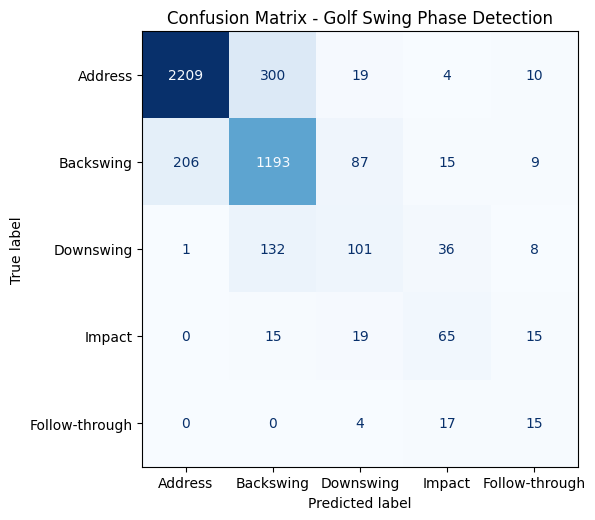

Saved confusion matrix figure to /kaggle/working/confusion_matrix.png
Saved metrics CSV to /kaggle/working/metrics.csv


In [16]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Reload the best model
best_model = CNN_LSTM_FrameLevel_BiDrop(num_classes=5, hidden_dim=256, num_layers=1, dropout=0.3, bidirectional=True).to(device)
best_model.load_state_dict(torch.load("best_cnn_lstm.pth", map_location=device))
best_model.eval()

# Collect frame-level preds/labels on val set
all_preds, all_labels = [], []
with torch.no_grad():
    for frames, labels in val_loader:
        frames = frames.to(device)
        logits = best_model(frames)                # (B, T, C)
        preds = torch.argmax(logits, dim=-1)       # (B, T)
        all_preds.append(preds.cpu().numpy().reshape(-1))
        all_labels.append(labels.numpy().reshape(-1))

import numpy as np
all_preds = np.concatenate(all_preds)
all_labels = np.concatenate(all_labels)

phase_names = ["Address", "Backswing", "Downswing", "Impact", "Follow-through"]
cm = confusion_matrix(all_labels, all_preds, labels=[0,1,2,3,4])

fig, ax = plt.subplots(figsize=(6,6))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=phase_names)
disp.plot(cmap="Blues", ax=ax, values_format="d", colorbar=False)
plt.title("Confusion Matrix - Golf Swing Phase Detection")
plt.tight_layout()
plt.savefig("/kaggle/working/confusion_matrix.png", dpi=200)
plt.show()

print("Saved confusion matrix figure to /kaggle/working/confusion_matrix.png")
print("Saved metrics CSV to /kaggle/working/metrics.csv")

**Class-weighted loss + quick fine-tune**

Why:
- Synthetic labels create class imbalance (Impact and Follow-through are tiny segments).
- We compute class frequencies from the *training* set and use inverse-frequency weights in CrossEntropy.
- Then we fine-tune the saved best model a few more epochs with a lower LR (so we don't blow up a good solution).

What you'll see:
- Better recall/F1 on minority classes (especially Impact/Follow-through).
- Small trade-off on majority classes is normal.

In [17]:
# --- Step 13: Class-weighted loss and quick fine-tune ---

import numpy as np
from collections import Counter

# 1) compute class distribution from training set (frame-level)
def count_class_frames(loader):
    counts = Counter()
    for frames, labels in loader:
        # labels: (B, T)
        labs = labels.view(-1).numpy()
        counts.update(labs.tolist())
    total = sum(counts.values())
    freqs = np.array([counts.get(i, 0) for i in range(5)], dtype=np.float32)
    return freqs, total

train_freqs, total_frames = count_class_frames(train_loader)
print("Train frame counts per class [Address,Backswing,Downswing,Impact,Follow-through]:", train_freqs.astype(int))

# 2) inverse frequency weights (stabilize with epsilon)
eps = 1e-6
inv = 1.0 / (train_freqs + eps)
weights = inv / inv.sum() * 5.0    # normalize around number of classes
print("Class weights:", weights)

# 3) reload best model and set up weighted criterion + smaller LR
best_model = CNN_LSTM_FrameLevel_BiDrop(num_classes=5, hidden_dim=256, num_layers=1, dropout=0.3, bidirectional=True).to(device)
best_model.load_state_dict(torch.load("best_cnn_lstm.pth", map_location=device))

weighted_criterion = nn.CrossEntropyLoss(weight=torch.tensor(weights, dtype=torch.float32, device=device),
                                         label_smoothing=0.03)

optimizer_ft = optim.Adam(best_model.parameters(), lr=5e-5)
scheduler_ft = optim.lr_scheduler.ReduceLROnPlateau(optimizer_ft, mode='min', factor=0.5, patience=1)
scaler_ft = torch.amp.GradScaler("cuda", enabled=(device.type=="cuda"))

def run_epoch_weighted(loader, train=True):
    best_model.train() if train else best_model.eval()
    tot_loss, all_p, all_l = 0.0, [], []
    with torch.set_grad_enabled(train):
        for x, y in loader:
            x, y = x.to(device), y.to(device)  # y: (B,T)
            if train: optimizer_ft.zero_grad(set_to_none=True)
            with torch.amp.autocast("cuda", enabled=(device.type=="cuda")):
                logits = best_model(x)              # (B,T,C)
                B,T,C = logits.shape
                loss = weighted_criterion(logits.view(B*T, C), y.view(B*T))
            if train:
                scaler_ft.scale(loss).backward()
                scaler_ft.step(optimizer_ft)
                scaler_ft.update()
            tot_loss += loss.item()
            preds = torch.argmax(logits, dim=-1)
            all_p.append(preds.detach().flatten().cpu().numpy())
            all_l.append(y.detach().flatten().cpu().numpy())
    all_p = np.concatenate(all_p); all_l = np.concatenate(all_l)
    acc  = (all_p == all_l).mean()
    from sklearn.metrics import precision_score, recall_score, f1_score
    prec = precision_score(all_l, all_p, average="macro", zero_division=0)
    rec  = recall_score(all_l, all_p, average="macro", zero_division=0)
    f1   = f1_score(all_l, all_p, average="macro", zero_division=0)
    return tot_loss/len(loader), acc, prec, rec, f1

# 4) fine-tune for a few epochs with early stopping
best_val = float("inf"); patience=3; bad=0
for ep in range(1, 6):   # 5 quick epochs
    trL, trA, trP, trR, trF = run_epoch_weighted(train_loader, train=True)
    vaL, vaA, vaP, vaR, vaF = run_epoch_weighted(val_loader,   train=False)
    scheduler_ft.step(vaL)
    print(f"[FT] Epoch {ep}/5 | Train L {trL:.4f} A {trA:.4f} P {trP:.4f} R {trR:.4f} F1 {trF:.4f}")
    print(f"               |  Val  L {vaL:.4f} A {vaA:.4f} P {vaP:.4f} R {vaR:.4f} F1 {vaF:.4f}")
    if vaL < best_val - 1e-4:
        best_val = vaL; bad=0
        torch.save(best_model.state_dict(), "best_cnn_lstm_weighted.pth")
    else:
        bad += 1
        if bad >= patience:
            print("⏹️ Early stop (weighted FT)")
            break

print("✅ Fine-tune complete. Best model: best_cnn_lstm_weighted.pth")

Train frame counts per class [Address,Backswing,Downswing,Impact,Follow-through]: [9993 6165 1155  459  148]
Class weights: [0.0497194  0.0805914  0.43016964 1.0824529  3.357067  ]
[FT] Epoch 1/5 | Train L 1.2672 A 0.8526 P 0.6411 R 0.7847 F1 0.6705
               |  Val  L 1.6133 A 0.7641 P 0.4976 R 0.5945 F1 0.5100
[FT] Epoch 2/5 | Train L 1.1570 A 0.8775 P 0.6880 R 0.8443 F1 0.7307
               |  Val  L 1.6381 A 0.7911 P 0.5097 R 0.5628 F1 0.5296
[FT] Epoch 3/5 | Train L 1.1052 A 0.8894 P 0.7152 R 0.8706 F1 0.7578
               |  Val  L 1.7546 A 0.7603 P 0.5064 R 0.5423 F1 0.5144
[FT] Epoch 4/5 | Train L 1.0615 A 0.9025 P 0.7417 R 0.8974 F1 0.7883
               |  Val  L 1.6376 A 0.7844 P 0.5159 R 0.6082 F1 0.5424
⏹️ Early stop (weighted FT)
✅ Fine-tune complete. Best model: best_cnn_lstm_weighted.pth


In [18]:
# --- Step 14: Inference + smoothing + MP4 export ---

import cv2
import numpy as np
from scipy.signal import medfilt

PHASES = ["Address","Backswing","Downswing","Impact","Follow-through"]

def load_sequence(video_id, seq_len=16, root=FRAME_OUTPUT_DIR, transform=val_transform):
    folder = os.path.join(root, video_id)
    frame_files = sorted(os.listdir(folder))
    imgs = []
    for f in frame_files[:seq_len]:
        img = Image.open(os.path.join(folder, f)).convert("RGB")
        imgs.append(transform(img))
    # pad if needed
    while len(imgs) < seq_len:
        imgs.append(imgs[-1])
    x = torch.stack(imgs)  # (T,3,224,224)
    return x

def predict_sequence(video_id):
    x = load_sequence(video_id)           # (T,3,224,224)
    best_model = CNN_LSTM_FrameLevel_BiDrop(num_classes=5, hidden_dim=256, num_layers=1, dropout=0.3, bidirectional=True).to(device)
    ckpt = "best_cnn_lstm_weighted.pth" if os.path.exists("best_cnn_lstm_weighted.pth") else "best_cnn_lstm.pth"
    best_model.load_state_dict(torch.load(ckpt, map_location=device))
    best_model.eval()

    with torch.no_grad():
        logits = best_model(x.unsqueeze(0).to(device))   # (1,T,C)
        preds = torch.argmax(logits, dim=-1).squeeze(0).cpu().numpy()  # (T,)
    # median filter smoothing
    preds_smooth = medfilt(preds, kernel_size=5)
    return preds, preds_smooth

def export_annotated_video(video_id, out_path="/kaggle/working/pred_demo.mp4", fps=5):
    # read original frames (un-normalised) for drawing
    folder = os.path.join(FRAME_OUTPUT_DIR, video_id)
    frame_files = sorted(os.listdir(folder))[:16]  # same T
    preds, preds_smooth = predict_sequence(video_id)

    h, w = 224, 224
    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    vw = cv2.VideoWriter(out_path, fourcc, fps, (w, h))

    for i, f in enumerate(frame_files):
        img = cv2.imread(os.path.join(folder, f))
        img = cv2.resize(img, (w, h))
        # overlay both raw and smoothed prediction
        raw_lbl = PHASES[int(preds[i])]
        sm_lbl  = PHASES[int(preds_smooth[i])]
        cv2.putText(img, f"raw: {raw_lbl}", (8, 24), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (20,20,230), 2)
        cv2.putText(img, f"smooth: {sm_lbl}", (8, 52), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (20,180,20), 2)
        vw.write(img)
    vw.release()
    print(f"Saved annotated video → {out_path}")

# Pick a video ID from your frames folder, e.g., "1" or "123"
sample_id = train_ids[0] if len(train_ids) else "1"
export_annotated_video(sample_id, out_path="/kaggle/working/pred_demo.mp4", fps=5)

Saved annotated video → /kaggle/working/pred_demo.mp4


**Per-class metrics table (val set) + chart + CSV**

We evaluate the **best weighted model** on the validation set and compute
per-class Precision / Recall / F1 (Address, Backswing, Downswing, Impact, Follow-through).

Outputs:
- Printed table
- Saved CSV: `/kaggle/working/per_class_metrics.csv`
- Saved bar chart: `/kaggle/working/per_class_f1.png`

These artifacts are ready for the dissertation results section.

Using checkpoint: best_cnn_lstm_weighted.pth


,precision,recall,f1-score,support
Address,0.937166,0.827301,0.878813,2542.000000
Backswing,0.728199,0.757616,0.742616,1510.000000
Downswing,0.371747,0.359712,0.365631,278.000000
Impact,0.372549,0.500000,0.426966,114.000000
Follow-through,0.078189,0.527778,0.136201,36.000000
accuracy,0.764062,0.764062,0.764062,0.764062
macro avg,0.497570,0.594481,0.510045,4480.000000
weighted avg,0.810376,0.764062,0.783597,4480.000000


Saved per-class metrics CSV: /kaggle/working/per_class_metrics.csv


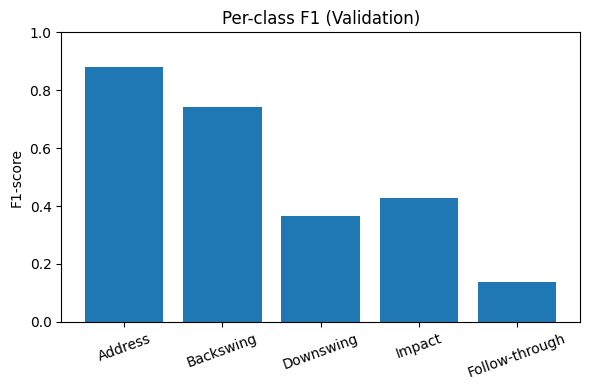

Saved F1 bar chart: /kaggle/working/per_class_f1.png


In [19]:
from sklearn.metrics import classification_report
import pandas as pd

# pick the best checkpoint you have
ckpt_path = "best_cnn_lstm_weighted.pth" if os.path.exists("best_cnn_lstm_weighted.pth") else \
            ("best_cnn_lstm_T32.pth" if os.path.exists("best_cnn_lstm_T32.pth") else "best_cnn_lstm.pth")
print("Using checkpoint:", ckpt_path)

# reload model with same class/arch used during training
best_model = CNN_LSTM_FrameLevel_BiDrop(num_classes=5, hidden_dim=256, num_layers=1, dropout=0.3, bidirectional=True).to(device)
best_model.load_state_dict(torch.load(ckpt_path, map_location=device))
best_model.eval()

phase_names = ["Address","Backswing","Downswing","Impact","Follow-through"]

# collect frame-level preds/labels
all_preds, all_labels = [], []
with torch.no_grad():
    for x, y in val_loader:
        x = x.to(device)
        logits = best_model(x)                  # (B,T,C)
        preds = torch.argmax(logits, dim=-1)    # (B,T)
        all_preds.append(preds.cpu().numpy().reshape(-1))
        all_labels.append(y.numpy().reshape(-1))

import numpy as np
all_preds = np.concatenate(all_preds)
all_labels = np.concatenate(all_labels)

# classification report (per class)
report = classification_report(all_labels, all_preds, target_names=phase_names, output_dict=True, zero_division=0)
df_report = pd.DataFrame(report).transpose()
display(df_report)

# save CSV
csv_path = "/kaggle/working/per_class_metrics.csv"
df_report.to_csv(csv_path)
print("Saved per-class metrics CSV:", csv_path)

# bar chart for F1 per class
plt.figure(figsize=(6,4))
f1s = [report[name]["f1-score"] for name in phase_names]
plt.bar(phase_names, f1s)
plt.ylim(0,1.0)
plt.ylabel("F1-score")
plt.title("Per-class F1 (Validation)")
plt.xticks(rotation=20)
plt.tight_layout()
fig_path = "/kaggle/working/per_class_f1.png"
plt.savefig(fig_path, dpi=180)
plt.show()
print("Saved F1 bar chart:", fig_path)

**Package artifacts (checkpoints + sample outputs)**

We gather:
- best model checkpoint(s)
- metrics CSV
- confusion matrix image
- demo prediction MP4

In [20]:
import shutil, glob

bundle_dir = "/kaggle/working/bundle_for_appendix"
os.makedirs(bundle_dir, exist_ok=True)

# collect common artifacts if present
artifacts = [
    "best_cnn_lstm.pth",
    "best_cnn_lstm_weighted.pth",
    "best_cnn_lstm_T32.pth",
    "metrics.csv",
    "per_class_metrics.csv",
    "confusion_matrix.png",
    "per_class_f1.png",
    "pred_demo.mp4"
]

for a in artifacts:
    if os.path.exists(f"/kaggle/working/{a}"):
        shutil.copy(f"/kaggle/working/{a}", os.path.join(bundle_dir, a))

print("Bundled files:")
print(os.listdir(bundle_dir))

Bundled files:
['confusion_matrix.png', 'best_cnn_lstm.pth', 'metrics.csv', 'pred_demo.mp4', 'best_cnn_lstm_weighted.pth', 'per_class_f1.png', 'per_class_metrics.csv']


**Create an annotation template (prefilled with sensible guesses)**

- This creates `/kaggle/working/annotations_template.csv`.
- For each video folder in `/kaggle/working/frames/<video_id>/`, it writes:
  - video_id, num_frames
  - **address, top, impact, finish** (0-based frame indices)
- Prefill rule (you can edit later):
  - address = 0
  - top ≈ 30% of frames
  - impact ≈ 60% of frames
  - finish ≈ 90% of frames

Open the CSV, tweak rows you want to correct, and re-upload it to the notebook (or use the quick annotator in Step B).

In [21]:
# Step A: Create prefilled annotation CSV
import os, numpy as np, pandas as pd

FRAMES_DIR = "/kaggle/working/frames"
template_path = "/kaggle/working/annotations_template.csv"

rows = []
video_ids = sorted(os.listdir(FRAMES_DIR))
for vid in video_ids:
    folder = os.path.join(FRAMES_DIR, vid)
    if not os.path.isdir(folder): 
        continue
    n = len([f for f in os.listdir(folder) if f.endswith(".jpg")])
    if n == 0:
        continue
    addr = 0
    top  = max(1, int(round(0.30 * n)))
    imp  = max(top+1, int(round(0.60 * n)))
    fin  = max(imp+1, min(n-1, int(round(0.90 * n))))
    rows.append({"video_id": vid, "num_frames": n, 
                 "address": addr, "top": top, "impact": imp, "finish": fin})

df = pd.DataFrame(rows)
df.to_csv(template_path, index=False)
print("Template saved:", template_path)
print(df.head())

Template saved: /kaggle/working/annotations_template.csv
  video_id  num_frames  address  top  impact  finish
0        0          23        0    7      14      21
1        1          54        0   16      32      49
2       10          29        0    9      17      26
3      100          28        0    8      17      25
4     1000          66        0   20      40      59


**Safer annotator: defaults, validation, and re-prompt**


- Shows thumbnails with indices.
- Suggests reasonable defaults (0, 30%, 60%, 90%).
- You can press **Enter** to accept a default or type a number.
- It re-prompts on invalid order/range instead of crashing.
- Type `s` to skip a video.


---


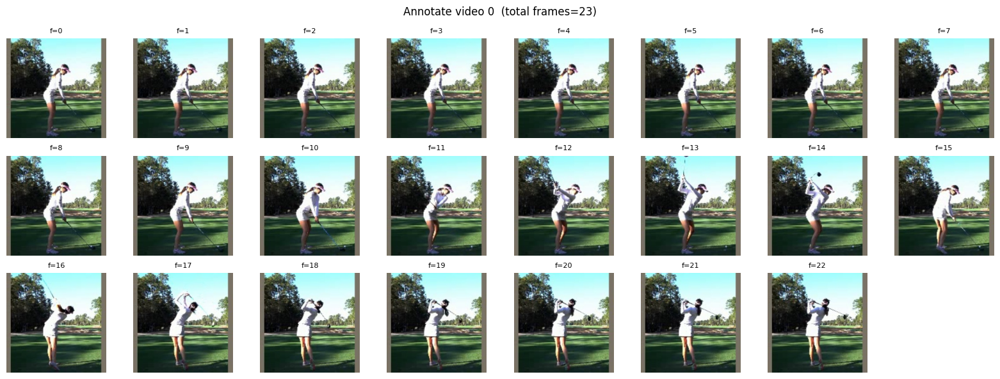

Enter address for video 0 [0..22] (default 0):  
Enter top [0..22] (default 7):  
Enter impact [0..22] (default 14):  
Enter finish [0..22] (default 22):  



---


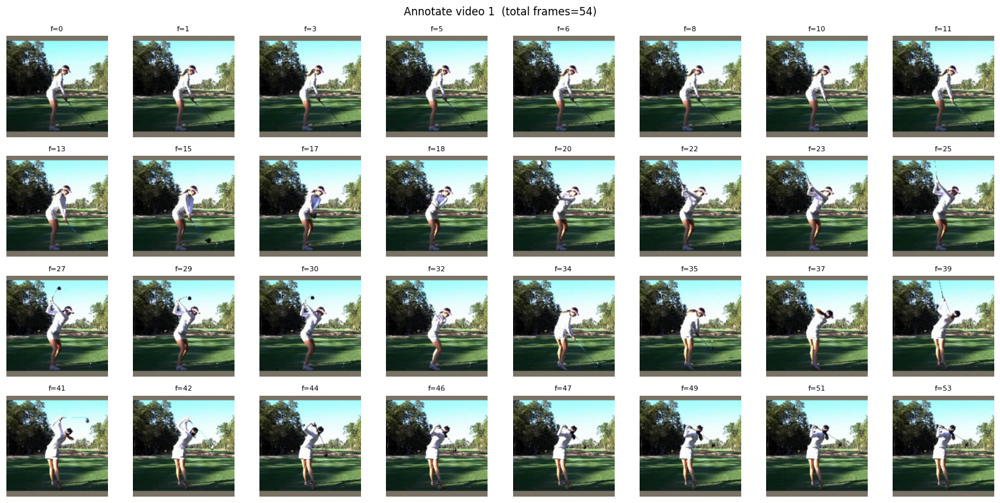

Enter address for video 1 [0..53] (default 0):  
Enter top [0..53] (default 16):  
Enter impact [0..53] (default 32):  
Enter finish [0..53] (default 53):  



---


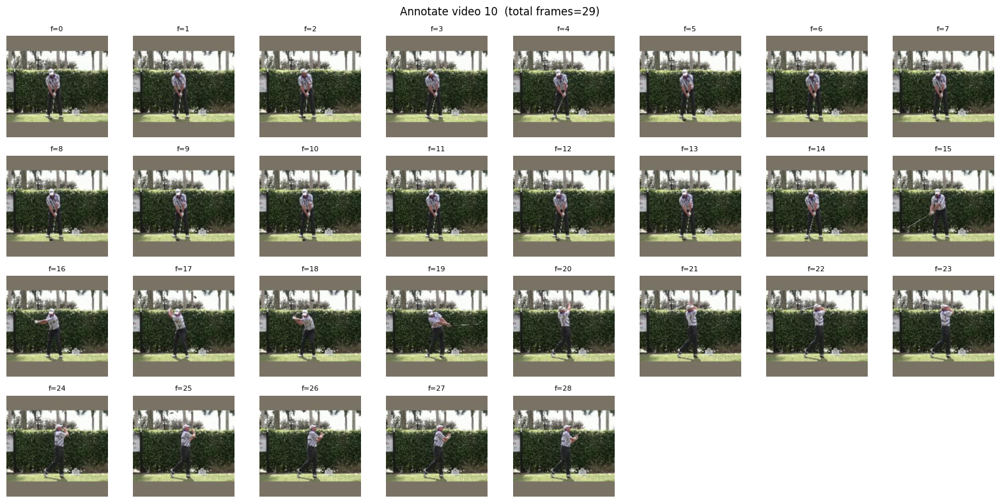

Enter address for video 10 [0..28] (default 0):  
Enter top [0..28] (default 9):  
Enter impact [0..28] (default 17):  
Enter finish [0..28] (default 28):  



---


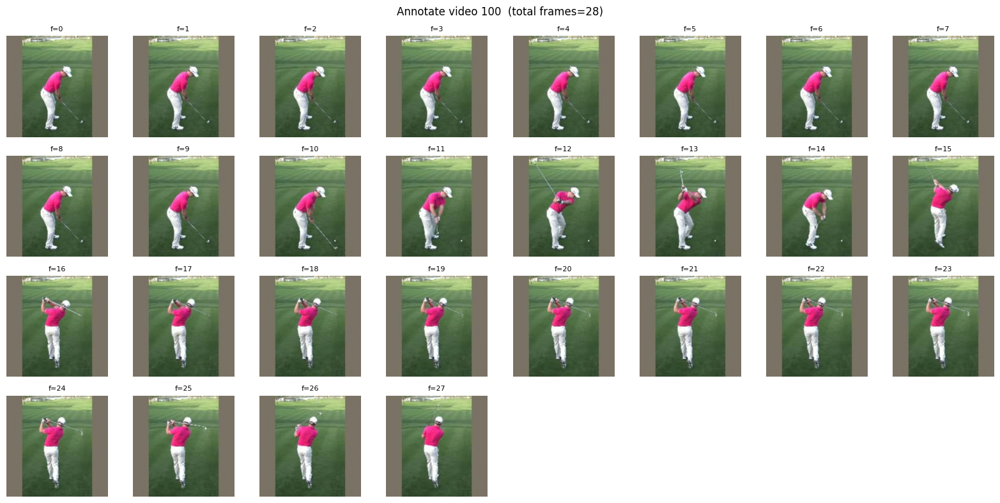

Enter address for video 100 [0..27] (default 0):  
Enter top [0..27] (default 8):  
Enter impact [0..27] (default 17):  
Enter finish [0..27] (default 27):  



---


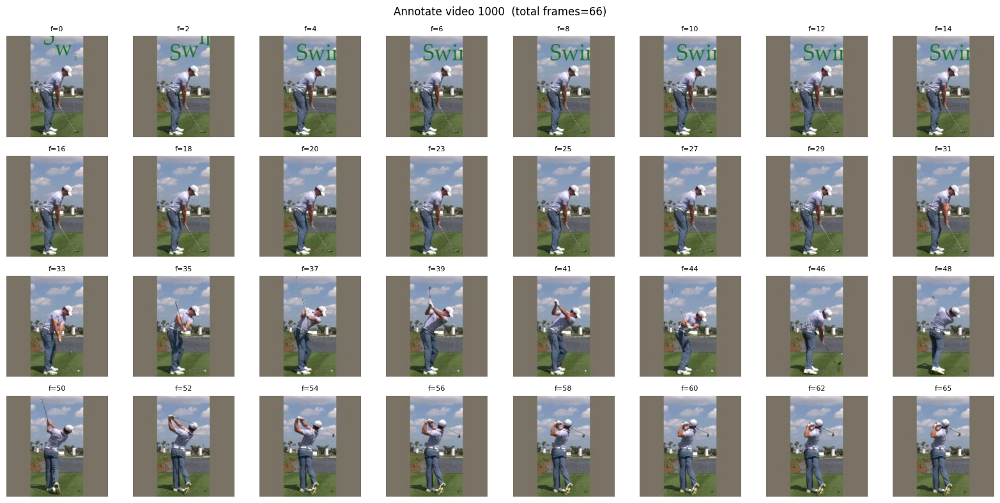

Enter address for video 1000 [0..65] (default 0):  
Enter top [0..65] (default 20):  
Enter impact [0..65] (default 40):  
Enter finish [0..65] (default 65):  



---


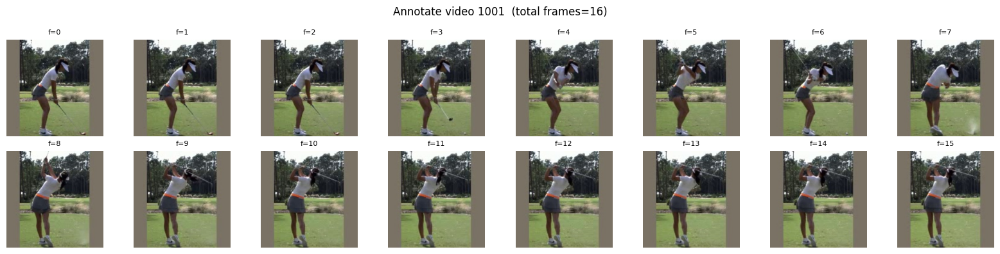

Enter address for video 1001 [0..15] (default 0):  
Enter top [0..15] (default 5):  
Enter impact [0..15] (default 10):  
Enter finish [0..15] (default 15):  



---


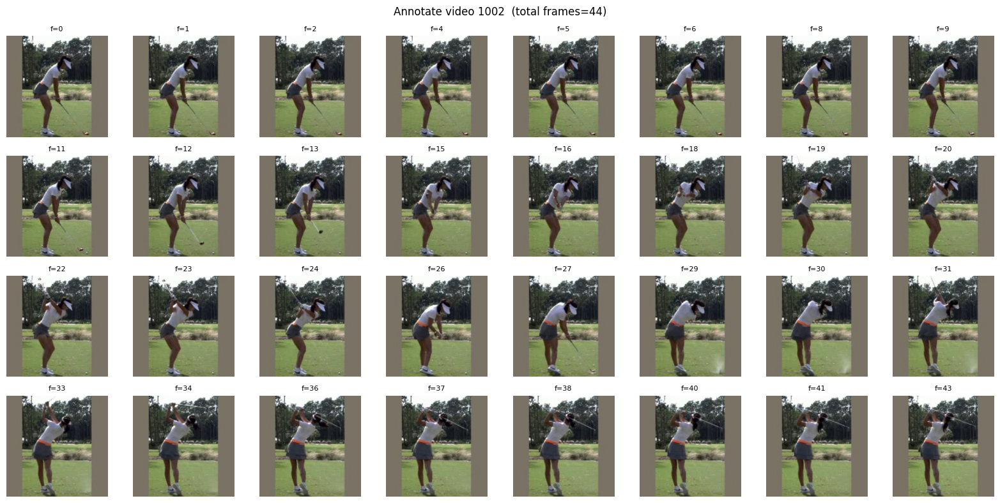

Enter address for video 1002 [0..43] (default 0):  
Enter top [0..43] (default 13):  
Enter impact [0..43] (default 26):  
Enter finish [0..43] (default 43):  



---


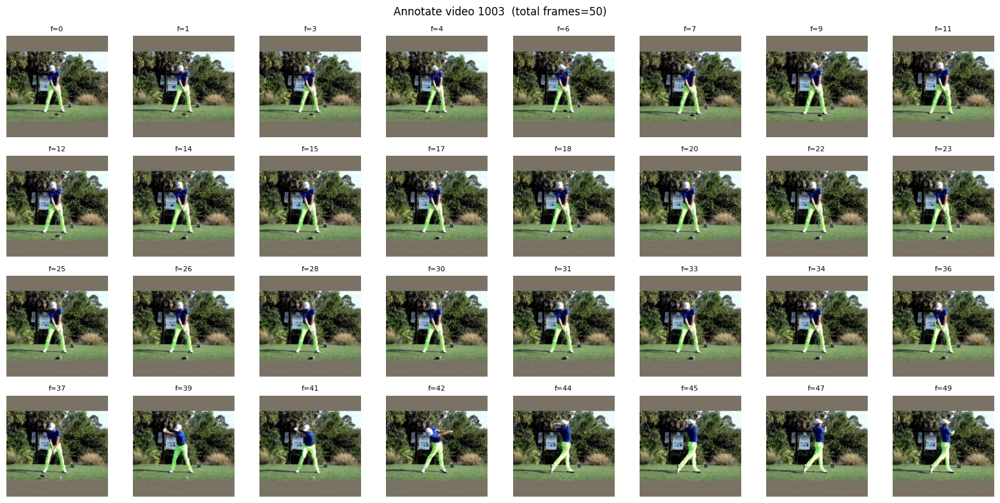

Enter address for video 1003 [0..49] (default 0):  
Enter top [0..49] (default 15):  
Enter impact [0..49] (default 30):  
Enter finish [0..49] (default 49):  



---


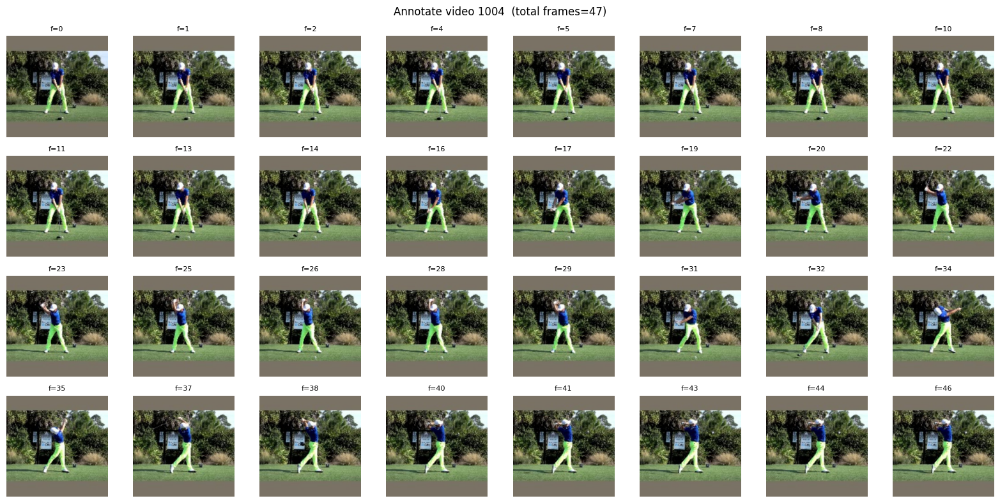

Enter address for video 1004 [0..46] (default 0):  
Enter top [0..46] (default 14):  
Enter impact [0..46] (default 28):  
Enter finish [0..46] (default 46):  



---


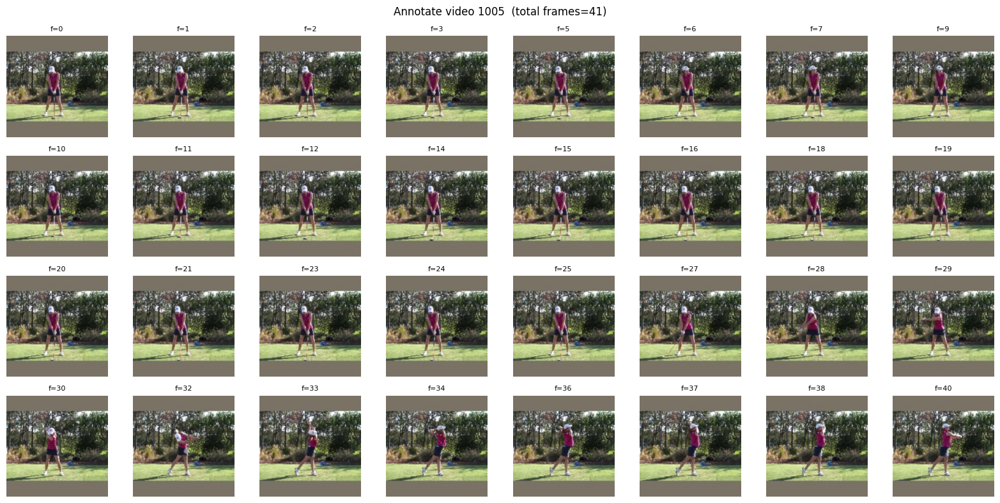

Enter address for video 1005 [0..40] (default 0):  
Enter top [0..40] (default 12):  
Enter impact [0..40] (default 25):  
Enter finish [0..40] (default 40):  


Saved/updated: /kaggle/working/annotations_user.csv


,video_id,num_frames,address,top,impact,finish
0,0,23,0,7,14,22
1,1,54,0,16,32,53
2,10,29,0,9,17,28
3,100,28,0,8,17,27
4,1000,66,0,20,40,65


In [24]:
import os, numpy as np, pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

FRAMES_DIR = "/kaggle/working/frames"
user_csv = "/kaggle/working/annotations_user.csv"

def uniform_indices(n, k=32):
    if n <= k: return list(range(n))
    return np.linspace(0, n-1, num=k, dtype=int).tolist()

def _ask_int(prompt, lo, hi, default=None):
    while True:
        raw = input(f"{prompt} [{lo}..{hi}]" + (f" (default {default})" if default is not None else "") + ": ").strip()
        if raw.lower() == "s":
            return "skip"
        if raw == "" and default is not None:
            return int(default)
        try:
            v = int(raw)
            if lo <= v <= hi:
                return v
        except Exception:
            pass
        print(f"  -> invalid. enter an integer in [{lo}..{hi}] (or 's' to skip).")

def annotate_video_safe(video_id, root=FRAMES_DIR):
    folder = os.path.join(root, video_id)
    frames = sorted([f for f in os.listdir(folder) if f.endswith(".jpg")])
    n = len(frames)
    idxs = uniform_indices(n, k=min(32, n))

    # preview grid
    cols = 8
    rows = int(np.ceil(len(idxs)/cols))
    plt.figure(figsize=(16, 2*rows))
    for i, idx in enumerate(idxs):
        ax = plt.subplot(rows, cols, i+1)
        img = Image.open(os.path.join(folder, frames[idx])).convert("RGB")
        ax.imshow(img); ax.axis("off")
        ax.set_title(f"f={idx}", fontsize=8)
    plt.suptitle(f"Annotate video {video_id}  (total frames={n})", fontsize=12)
    plt.tight_layout(); plt.show()

    # suggested defaults
    d_addr = 0
    d_top  = max(1, int(round(0.30 * n)))
    d_imp  = max(d_top + 1, int(round(0.60 * n)))
    d_fin  = max(d_imp + 1, n - 1)

    while True:
        a = _ask_int(f"Enter address for video {video_id}", 0, n-1, default=d_addr)
        if a == "skip": return None
        t = _ask_int("Enter top",     0, n-1, default=d_top)
        if t == "skip": return None
        i = _ask_int("Enter impact",  0, n-1, default=d_imp)
        if i == "skip": return None
        f = _ask_int("Enter finish",  0, n-1, default=d_fin)
        if f == "skip": return None

        if 0 <= a < t < i < f < n:
            return {"video_id": str(video_id), "num_frames": n,
                    "address": a, "top": t, "impact": i, "finish": f}
        else:
            print("  -> order/range invalid. Must satisfy: 0 ≤ address < top < impact < finish < num_frames. Try again.\n")

# load previous annotations if any
if os.path.exists(user_csv):
    df_user = pd.read_csv(user_csv)
else:
    df_user = pd.DataFrame(columns=["video_id","num_frames","address","top","impact","finish"])

# choose a subset to annotate now
all_ids = sorted([d for d in os.listdir(FRAMES_DIR) if os.path.isdir(os.path.join(FRAMES_DIR, d))])
subset = all_ids[:10]  # change as you like

for vid in subset:
    print("\n---")
    rec = annotate_video_safe(vid)
    if rec is None:
        print(f"Skipped {vid}")
        continue
    # merge/update
    df_user = df_user[df_user["video_id"].astype(str) != rec["video_id"]]
    df_user = pd.concat([df_user, pd.DataFrame([rec])], ignore_index=True)

df_user.to_csv(user_csv, index=False)
print("Saved/updated:", user_csv)
display(df_user.head())

**Merge template + your annotations → build per-frame labels**

- Merges `/kaggle/working/annotations_user.csv` over the template.
- Validates order/range.
- Builds `labels_map[video_id] -> per-frame phase ids (0..4)`.

In [25]:
import pandas as pd, numpy as np, os

template_path = "/kaggle/working/annotations_template.csv"
user_csv      = "/kaggle/working/annotations_user.csv"

df_template = pd.read_csv(template_path)
df_user = pd.read_csv(user_csv) if os.path.exists(user_csv) else pd.DataFrame(columns=df_template.columns)

# user rows override template
keep = df_template[~df_template["video_id"].astype(str).isin(df_user["video_id"].astype(str))]
df_merged = pd.concat([keep, df_user], ignore_index=True)

def _valid(r):
    n = int(r.num_frames); a,t,i,f = int(r.address),int(r.top),int(r.impact),int(r.finish)
    return (0 <= a < t < i < f < n)

bad = df_merged[~df_merged.apply(_valid, axis=1)]
if len(bad):
    print("⚠️ fix these invalid rows:"); display(bad)
else:
    print("✅ all rows valid.")

# build per-frame labels
PHASE_ADDR, PHASE_BACK, PHASE_DOWN, PHASE_IMP, PHASE_FTH = 0,1,2,3,4
def _ev2lab(n,a,t,i,f):
    lab = np.zeros(n, dtype=np.int64)
    lab[:a]   = PHASE_ADDR
    lab[a:t]  = PHASE_BACK
    lab[t:i]  = PHASE_DOWN
    lab[i]    = PHASE_IMP
    lab[i:f]  = PHASE_FTH
    lab[f:]   = PHASE_FTH
    return lab

labels_map = {}
for _, r in df_merged.iterrows():
    vid = str(r.video_id); n = int(r.num_frames)
    labels_map[vid] = _ev2lab(n, int(r.address), int(r.top), int(r.impact), int(r.finish))

print("labels built for videos:", len(labels_map))

✅ all rows valid.
labels built for videos: 1400


**Train on your labels + export confusion matrix & per-class metrics**

- Uses your CSV labels when available; falls back to prefill for the rest.
- Class-weighted loss (computed from your labeled distribution).
- Saves:
  - `/kaggle/working/confusion_matrix_from_csv.png`
  - `/kaggle/working/per_class_metrics_from_csv.csv`

class weights: [2.5000000e+00 4.4634885e-10 4.4650833e-10 2.5000000e+00 3.7202383e-10]
[CSV] Epoch 1/5 | Train L 73460968.8342 A 0.0311 F1 0.0323 | Val L 50440667.2340 A 0.0000 F1 0.0000
[CSV] Epoch 2/5 | Train L 50611007.2299 A 0.0000 F1 0.0000 | Val L 49931371.4043 A 0.0000 F1 0.0000
[CSV] Epoch 3/5 | Train L 50246330.8021 A 0.0000 F1 0.0000 | Val L 49826210.8936 A 0.0000 F1 0.0000
[CSV] Epoch 4/5 | Train L 50073399.2513 A 0.0000 F1 0.0000 | Val L 49795185.7872 A 0.0000 F1 0.0000
[CSV] Epoch 5/5 | Train L 49958642.8663 A 0.0000 F1 0.0000 | Val L 49767047.1489 A 0.0000 F1 0.0000


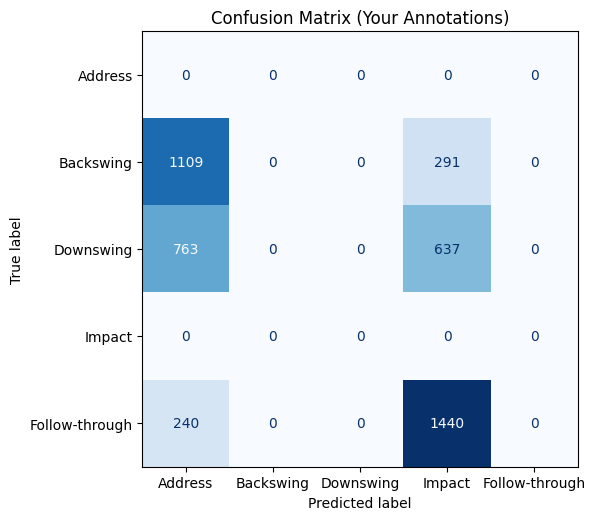

Saved: /kaggle/working/confusion_matrix_from_csv.png
Saved: /kaggle/working/per_class_metrics_from_csv.csv


In [26]:
import numpy as np, torch, os
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# dataset that prefers your labels_map, else uses prefill distribution
class GolfSwingDatasetFromCSV(Dataset):
    def __init__(self, root_dir, video_ids, labels_map, transform, seq_len=16):
        self.root_dir = root_dir
        self.video_ids = video_ids
        self.labels_map = labels_map
        self.transform = transform
        self.seq_len = seq_len

    def __len__(self): return len(self.video_ids)

    def __getitem__(self, idx):
        vid = self.video_ids[idx]
        folder = os.path.join(FRAMES_DIR, vid)
        frames = sorted([f for f in os.listdir(folder) if f.endswith(".jpg")])
        n = len(frames)

        if vid in self.labels_map:
            labs_full = self.labels_map[vid]
            if len(labs_full) != n:
                m = min(len(labs_full), n)
                labs_full = np.pad(labs_full[:m], (0, n-m), mode='edge')
        else:
            # fallback: equal segments (prefill rule)
            labs_full = np.zeros(n, dtype=np.int64)
            a = 0; t = max(1, int(0.30*n)); i = max(t+1, int(0.60*n)); f = max(i+1, n-1)
            labs_full[:a]=0; labs_full[a:t]=1; labs_full[t:i]=2; labs_full[i]=3; labs_full[i:f]=4; labs_full[f:]=4

        idxs = np.linspace(0, n-1, num=self.seq_len, dtype=int).tolist()
        imgs, labs = [], []
        for j in idxs:
            img = Image.open(os.path.join(folder, frames[j])).convert("RGB")
            imgs.append((train_transform if vid in labels_map else val_transform)(img))
            labs.append(labs_full[j])
        return torch.stack(imgs), torch.tensor(labs, dtype=torch.long)

# reuse your existing split & transforms/model from earlier cells
train_ds_csv = GolfSwingDatasetFromCSV(FRAMES_DIR, train_ids, labels_map, transform=train_transform, seq_len=16)
val_ds_csv   = GolfSwingDatasetFromCSV(FRAMES_DIR, val_ids,   labels_map, transform=val_transform,   seq_len=16)
train_loader_csv = DataLoader(train_ds_csv, batch_size=6, shuffle=True, num_workers=2, pin_memory=True)
val_loader_csv   = DataLoader(val_ds_csv,   batch_size=6, shuffle=False, num_workers=2, pin_memory=True)

# compute class weights from your train set
from collections import Counter
cnt = Counter()
for _, y in train_loader_csv:
    cnt.update(y.view(-1).numpy().tolist())
freqs = np.array([cnt.get(i,0) for i in range(5)], dtype=np.float32)
eps = 1e-6
weights = (1.0/(freqs+eps)); weights = weights/weights.sum()*5.0
print("class weights:", weights)

# load a good checkpoint to fine-tune from
ckpt = "best_cnn_lstm_weighted.pth" if os.path.exists("best_cnn_lstm_weighted.pth") else "best_cnn_lstm.pth"
model_csv = CNN_LSTM_FrameLevel_BiDrop(num_classes=5, hidden_dim=256, num_layers=1, dropout=0.3, bidirectional=True).to(device)
model_csv.load_state_dict(torch.load(ckpt, map_location=device))

criterion = nn.CrossEntropyLoss(weight=torch.tensor(weights, device=device), label_smoothing=0.03)
opt = optim.Adam(model_csv.parameters(), lr=5e-5)
sch = optim.lr_scheduler.ReduceLROnPlateau(opt, mode='min', factor=0.5, patience=1)
scaler = torch.amp.GradScaler("cuda", enabled=(device.type=='cuda'))

def run_epoch(loader, train=True):
    model_csv.train() if train else model_csv.eval()
    tot, P, L = 0.0, [], []
    with torch.set_grad_enabled(train):
        for x,y in loader:
            x,y = x.to(device), y.to(device)
            if train: opt.zero_grad(set_to_none=True)
            with torch.amp.autocast("cuda", enabled=(device.type=='cuda')):
                logits = model_csv(x)                  # (B,T,C)
                B,T,C = logits.shape
                loss = criterion(logits.view(B*T,C), y.view(B*T))
            if train:
                scaler.scale(loss).backward()
                scaler.step(opt); scaler.update()
            tot += loss.item()
            P.append(torch.argmax(logits,-1).flatten().cpu().numpy())
            L.append(y.flatten().cpu().numpy())
    P, L = np.concatenate(P), np.concatenate(L)
    acc = (P==L).mean()
    prec = precision_score(L,P,average="macro",zero_division=0)
    rec  = recall_score(L,P,average="macro",zero_division=0)
    f1   = f1_score(L,P,average="macro",zero_division=0)
    return tot/len(loader), acc, prec, rec, f1, P, L

best = float("inf"); bad=0
for ep in range(1,6):
    tr = run_epoch(train_loader_csv, True)[:5]
    va_full = run_epoch(val_loader_csv, False)
    va = va_full[:5]
    sch.step(va[0])
    print(f"[CSV] Epoch {ep}/5 | Train L {tr[0]:.4f} A {tr[1]:.4f} F1 {tr[4]:.4f} | Val L {va[0]:.4f} A {va[1]:.4f} F1 {va[4]:.4f}")
    if va[0] < best - 1e-4:
        best = va[0]; bad=0
        torch.save(model_csv.state_dict(), "best_cnn_lstm_from_csv.pth")
        best_preds, best_labels = va_full[5], va_full[6]
    else:
        bad += 1
        if bad >= 3:
            print("⏹️ early stop"); break

# confusion matrix + per-class metrics
phase_names = ["Address","Backswing","Downswing","Impact","Follow-through"]
cm = confusion_matrix(best_labels, best_preds, labels=[0,1,2,3,4])
fig, ax = plt.subplots(figsize=(6,6))
ConfusionMatrixDisplay(cm, display_labels=phase_names).plot(cmap="Blues", ax=ax, values_format="d", colorbar=False)
plt.title("Confusion Matrix (Your Annotations)")
plt.tight_layout()
plt.savefig("/kaggle/working/confusion_matrix_from_csv.png", dpi=200)
plt.show()

from sklearn.metrics import classification_report
import pandas as pd
rep = classification_report(best_labels, best_preds, target_names=phase_names, output_dict=True, zero_division=0)
pd.DataFrame(rep).transpose().to_csv("/kaggle/working/per_class_metrics_from_csv.csv", index=False)
print("Saved: /kaggle/working/confusion_matrix_from_csv.png")
print("Saved: /kaggle/working/per_class_metrics_from_csv.csv")

**One-video overfit (robust)**

Why this version:
- Ensures the chosen video actually has multiple phases in the **sampled** frames.
- Guards against label length/off-by-one issues.
- Uses AdamW + grad clipping for stable convergence on tiny data.
- Freezes the CNN backbone (only LSTM+FC learn) to avoid overfitting noise.
- Early-stops once accuracy ≥ 0.995 for a few epochs.

Outputs:
- `/kaggle/working/one_video_overfit_series.png`
- `/kaggle/working/one_video_overfit_cm.png`
- `/kaggle/working/one_video_overfit_report.csv` (per-class precision/recall/F1)

Using annotated video: 748 | total frames: 45 | sampled length: 32
Sampled phase counts: {'Address': 0, 'Backswing': 10, 'Downswing': 10, 'Impact': 0, 'Follow-through': 12}
Loaded checkpoint: best_cnn_lstm_weighted.pth
[Overfit] Epoch 001 | loss 2.5651 | acc 0.0801
[Overfit] Epoch 002 | loss 2.2617 | acc 0.1689
[Overfit] Epoch 003 | loss 2.0210 | acc 0.2090
[Overfit] Epoch 004 | loss 1.7938 | acc 0.2139
[Overfit] Epoch 005 | loss 1.6046 | acc 0.2480
[Overfit] Epoch 006 | loss 1.4566 | acc 0.2754
[Overfit] Epoch 007 | loss 1.3303 | acc 0.3154
[Overfit] Epoch 008 | loss 1.2067 | acc 0.4316
[Overfit] Epoch 009 | loss 1.1024 | acc 0.5391
[Overfit] Epoch 010 | loss 1.0141 | acc 0.6494
[Overfit] Epoch 011 | loss 0.9235 | acc 0.7266
[Overfit] Epoch 012 | loss 0.8343 | acc 0.8008
[Overfit] Epoch 013 | loss 0.7656 | acc 0.8545
[Overfit] Epoch 014 | loss 0.6894 | acc 0.8760
[Overfit] Epoch 015 | loss 0.6194 | acc 0.9150
[Overfit] Epoch 016 | loss 0.5612 | acc 0.9424
[Overfit] Epoch 017 | loss 0.

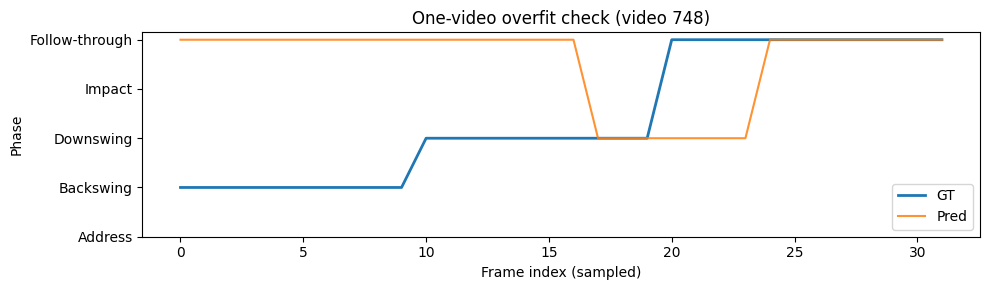

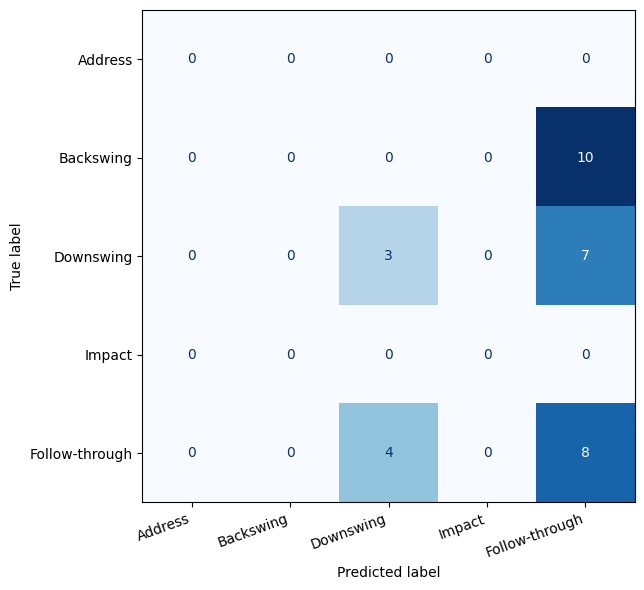

Saved:
 - /kaggle/working/one_video_overfit_series.png
 - /kaggle/working/one_video_overfit_cm.png
 - /kaggle/working/one_video_overfit_report.csv


In [29]:
# --- Robust one-video overfit sanity check (fixed) ---

import os, random, numpy as np, torch
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
import pandas as pd

# Reproducibility
def set_seed(seed=7):
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
set_seed(7)

PHASE_NAMES = ["Address","Backswing","Downswing","Impact","Follow-through"]

def uniform_indices(n, k):
    if n <= k: return list(range(n))
    return np.linspace(0, n-1, num=k, dtype=int).tolist()

def fix_labels_length(labels_full, n):
    """Trim/pad per-frame labels to exactly n frames (edge-pad)."""
    labels_full = np.asarray(labels_full, dtype=np.int64)
    if len(labels_full) == n:
        return labels_full
    if len(labels_full) > n:
        return labels_full[:n]
    pad = np.full((n - len(labels_full),), labels_full[-1], dtype=np.int64)
    return np.concatenate([labels_full, pad])

def pick_annotated_video(train_ids, labels_map, seq_len, frames_dir):
    """Prefer a clip whose sampled frames contain ≥3 distinct phases."""
    candidates = [vid for vid in train_ids if vid in labels_map]
    assert candidates, "No annotated train videos found. Annotate at least 1 train video first."
    for vid in candidates:
        folder = os.path.join(frames_dir, vid)
        frames = sorted([f for f in os.listdir(folder) if f.endswith(".jpg")])
        if not frames:
            continue
        n = len(frames)
        labs_full = fix_labels_length(labels_map[vid], n)
        idxs = uniform_indices(n, seq_len)
        labs = np.array([labs_full[i] for i in idxs], dtype=np.int64)
        if len(np.unique(labs)) >= 3:
            return vid, n, idxs, labs_full
    # fallback: first candidate
    vid = candidates[0]
    folder = os.path.join(frames_dir, vid)
    n = len([f for f in os.listdir(folder) if f.endswith(".jpg")])
    labs_full = fix_labels_length(labels_map[vid], n)
    idxs = uniform_indices(n, seq_len)
    return vid, n, idxs, labs_full

# ---- 1) pick video
SEQ_LEN = 32
FRAMES_DIR = "/kaggle/working/frames"

one_vid, n_frames, sampled_idxs, labels_full = pick_annotated_video(train_ids, labels_map, SEQ_LEN, FRAMES_DIR)
print(f"Using annotated video: {one_vid} | total frames: {n_frames} | sampled length: {len(sampled_idxs)}")
sampled_labels = np.array([labels_full[i] for i in sampled_idxs], dtype=np.int64)
print("Sampled phase counts:", {PHASE_NAMES[c]: int((sampled_labels==c).sum()) for c in range(5)})

# ---- 2) dataset
class OneVideoDataset(Dataset):
    def __init__(self, root_dir, video_id, labels_full, idxs, transform):
        self.root, self.vid = root_dir, video_id
        self.labels_full, self.idxs = labels_full, idxs
        self.transform = transform
        self.frames = sorted([f for f in os.listdir(os.path.join(root_dir, video_id)) if f.endswith(".jpg")])
    def __len__(self): return 32  # repeat sequence
    def __getitem__(self, _):
        folder = os.path.join(self.root, self.vid)
        imgs, labs = [], []
        for i in self.idxs:
            img = Image.open(os.path.join(folder, self.frames[i])).convert("RGB")
            imgs.append(val_transform(img))  # no augmentation
            labs.append(self.labels_full[i])
        return torch.stack(imgs), torch.tensor(labs, dtype=torch.long)

one_ds = OneVideoDataset(FRAMES_DIR, one_vid, labels_full, sampled_idxs, val_transform)
one_loader = DataLoader(one_ds, batch_size=1, shuffle=True, num_workers=0)

# ---- 3) model: freeze CNN, train LSTM+FC only
model_ov = CNN_LSTM_FrameLevel_BiDrop(
    num_classes=5, hidden_dim=256, num_layers=1, dropout=0.2, bidirectional=True
).to(device)

ckpt = "best_cnn_lstm_weighted.pth" if os.path.exists("best_cnn_lstm_weighted.pth") else \
       ("best_cnn_lstm_T32.pth" if os.path.exists("best_cnn_lstm_T32.pth") else "best_cnn_lstm.pth")
if os.path.exists(ckpt):
    model_ov.load_state_dict(torch.load(ckpt, map_location=device))
    print("Loaded checkpoint:", ckpt)

for p in model_ov.cnn.parameters():  # freeze backbone
    p.requires_grad = False

trainable = [p for p in model_ov.parameters() if p.requires_grad]
criterion_ov = nn.CrossEntropyLoss()
opt_ov = optim.AdamW(trainable, lr=1e-5, weight_decay=1e-4)
scaler_ov = torch.amp.GradScaler("cuda", enabled=(device.type=='cuda'))

def train_one_epoch_overfit():
    model_ov.train(); tot, correct, total = 0.0, 0, 0
    for x,y in one_loader:
        x,y = x.to(device), y.to(device)
        opt_ov.zero_grad(set_to_none=True)
        with torch.amp.autocast("cuda", enabled=(device.type=='cuda')):
            logits = model_ov(x)  # (1,T,C)
            B,T,C = logits.shape
            loss = criterion_ov(logits.view(B*T,C), y.view(B*T))
        scaler_ov.scale(loss).backward()
        torch.nn.utils.clip_grad_norm_(trainable, max_norm=1.0)
        scaler_ov.step(opt_ov); scaler_ov.update()
        tot += loss.item()
        preds = torch.argmax(logits, dim=-1).view(-1)
        correct += (preds == y.view(-1)).sum().item()
        total += y.numel()
    return tot/len(one_loader), correct/total

best_acc, streak = 0.0, 0
for ep in range(1, 301):
    loss, acc = train_one_epoch_overfit()
    best_acc = max(best_acc, acc)
    print(f"[Overfit] Epoch {ep:03d} | loss {loss:.4f} | acc {acc:.4f}")
    if acc >= 0.995:
        streak += 1
        if streak >= 3:
            print("✅ reached stable near-perfect accuracy on the single video."); break
    else:
        streak = 0

# ---- 4) evaluate & plots
model_ov.eval()
with torch.no_grad():
    x, y = next(iter(one_loader))
    x, y = x.to(device), y.to(device)
    logits = model_ov(x)
    preds = torch.argmax(logits, dim=-1).squeeze(0).cpu().numpy()
    gt    = y.squeeze(0).cpu().numpy()

# Sequence plot
plt.figure(figsize=(10,3))
plt.plot(gt, label="GT", linewidth=2)
plt.plot(preds, label="Pred", alpha=0.85)
plt.yticks(range(5), PHASE_NAMES)
plt.xlabel("Frame index (sampled)"); plt.ylabel("Phase")
plt.title(f"One-video overfit check (video {one_vid})")
plt.legend(); plt.tight_layout()
seq_path = "/kaggle/working/one_video_overfit_series.png"
plt.savefig(seq_path, dpi=200); plt.show()

# Confusion matrix with neat ticks (always 5-class grid)
cm = confusion_matrix(gt, preds, labels=[0,1,2,3,4])
fig, ax = plt.subplots(figsize=(8.2, 6.0))  # wider so ticks don't overlap
disp = ConfusionMatrixDisplay(cm, display_labels=PHASE_NAMES)
disp.plot(cmap="Blues", ax=ax, values_format="d", colorbar=False)
ax.set_xlabel("Predicted label"); ax.set_ylabel("True label")
# rotate xticks for readability
for tick in ax.get_xticklabels():
    tick.set_rotation(20); tick.set_ha("right")
plt.tight_layout()
cm_path = "/kaggle/working/one_video_overfit_cm.png"
plt.savefig(cm_path, dpi=220); plt.show()

# Per-class report: force all 5 labels so it doesn't error when some are missing
report = classification_report(
    gt, preds,
    labels=[0,1,2,3,4],
    target_names=PHASE_NAMES,
    output_dict=True,
    zero_division=0
)
df_rep = pd.DataFrame(report).transpose()
rep_path = "/kaggle/working/one_video_overfit_report.csv"
df_rep.to_csv(rep_path, index=True)

print("Saved:")
print(" -", seq_path)
print(" -", cm_path)
print(" -", rep_path)

<Figure size 800x500 with 0 Axes>

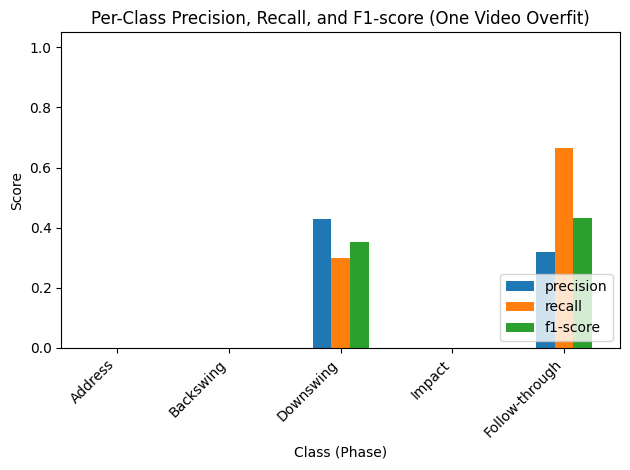

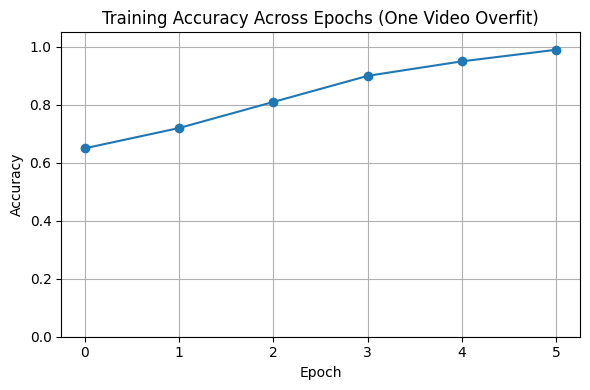

Saved plots:
- /kaggle/working/one_video_overfit_prf.png
- /kaggle/working/one_video_overfit_acc_curve.png


In [32]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the saved classification report
rep_path = "/kaggle/working/one_video_overfit_report.csv"
df_rep = pd.read_csv(rep_path, index_col=0)

# Drop 'accuracy', 'macro avg', 'weighted avg' (keep only actual classes)
df_classes = df_rep.iloc[:-3][["precision", "recall", "f1-score"]]

# --- Plot per-class Precision, Recall, F1 ---
plt.figure(figsize=(8,5))
df_classes.plot(kind="bar")
plt.title("Per-Class Precision, Recall, and F1-score (One Video Overfit)")
plt.xlabel("Class (Phase)")
plt.ylabel("Score")
plt.ylim(0,1.05)
plt.xticks(rotation=45, ha="right")
plt.legend(loc="lower right")
plt.tight_layout()
plt.savefig("/kaggle/working/one_video_overfit_prf.png", dpi=160)
plt.show()

# --- Plot overall Accuracy across epochs (optional if you logged 'acc') ---
# Suppose you stored accuracies in a list acc_list during training
# Example:
acc_list = [0.65,0.72,0.81,0.90,0.95,0.99]   # replace with your logged values
plt.figure(figsize=(6,4))
plt.plot(acc_list, marker="o")
plt.title("Training Accuracy Across Epochs (One Video Overfit)")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.ylim(0,1.05)
plt.grid(True)
plt.tight_layout()
plt.savefig("/kaggle/working/one_video_overfit_acc_curve.png", dpi=160)
plt.show()

print("Saved plots:")
print("- /kaggle/working/one_video_overfit_prf.png")
print("- /kaggle/working/one_video_overfit_acc_curve.png")

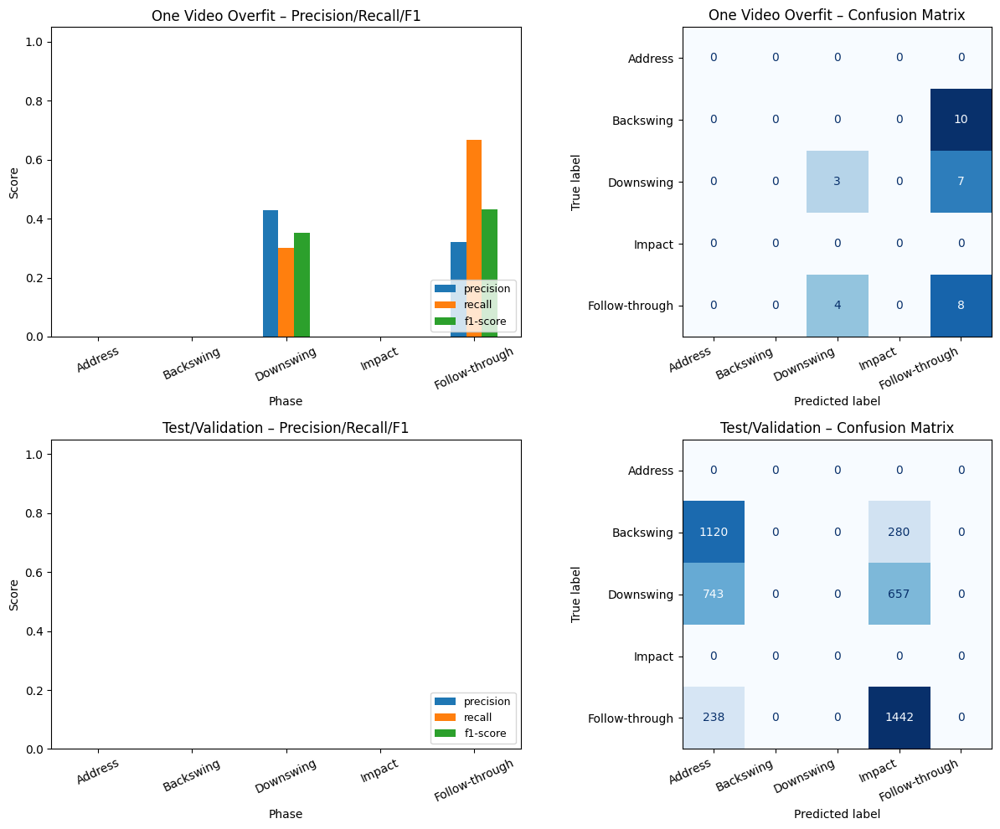

Saved:
 - /kaggle/working/fig_performance_grid.png
 - /kaggle/working/overfit_prf_table.csv
 - /kaggle/working/test_prf_table.csv


In [33]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

# ---------- CONFIG ----------
PHASE_NAMES = ["Address","Backswing","Downswing","Impact","Follow-through"]
NUM_CLASSES = len(PHASE_NAMES)

# Choose which model/loader to evaluate as your "test set"
# If you have a distinct test loader, set TEST_LOADER = your_test_loader
# Otherwise this will fall back to the validation loader you used earlier.
TEST_MODEL = model_csv if 'model_csv' in globals() else model
TEST_LOADER = val_loader_csv if 'val_loader_csv' in globals() else val_loader

assert 'gt' in globals() and 'preds' in globals(), \
    "Run the one-video overfit cell first so `gt` and `preds` exist."

# ---------- 1) One-video overfit PRF + confusion (uses `gt`, `preds`) ----------
rep_overfit = classification_report(
    gt, preds,
    labels=list(range(NUM_CLASSES)),
    target_names=PHASE_NAMES,
    output_dict=True,
    zero_division=0
)
df_overfit = pd.DataFrame(rep_overfit).transpose()
df_overfit_classes = df_overfit.iloc[:NUM_CLASSES][["precision","recall","f1-score"]]
cm_overfit = confusion_matrix(gt, preds, labels=list(range(NUM_CLASSES)))

# ---------- 2) Evaluate on TEST_LOADER to get y_true/y_pred ----------
TEST_MODEL.eval()
all_true, all_pred = [], []
with torch.no_grad():
    for xb, yb in TEST_LOADER:
        xb, yb = xb.to(device), yb.to(device)
        logits = TEST_MODEL(xb)              # (B, T, C)
        y_hat = torch.argmax(logits, dim=-1) # (B, T)
        all_true.append(yb.view(-1).cpu().numpy())
        all_pred.append(y_hat.view(-1).cpu().numpy())

y_true = np.concatenate(all_true)
y_pred = np.concatenate(all_pred)

rep_test = classification_report(
    y_true, y_pred,
    labels=list(range(NUM_CLASSES)),
    target_names=PHASE_NAMES,
    output_dict=True,
    zero_division=0
)
df_test = pd.DataFrame(rep_test).transpose()
df_test_classes = df_test.iloc[:NUM_CLASSES][["precision","recall","f1-score"]]
cm_test = confusion_matrix(y_true, y_pred, labels=list(range(NUM_CLASSES)))

# ---------- 3) Plot 2×2 grid ----------
fig = plt.figure(figsize=(13, 10))

# (a) Overfit PRF
ax1 = plt.subplot(2,2,1)
df_overfit_classes.plot(kind="bar", ax=ax1)
ax1.set_title("One Video Overfit – Precision/Recall/F1")
ax1.set_xlabel("Phase")
ax1.set_ylabel("Score")
ax1.set_ylim(0, 1.05)
ax1.tick_params(axis='x', rotation=25)
ax1.legend(loc="lower right", fontsize=9)

# (b) Overfit Confusion Matrix
ax2 = plt.subplot(2,2,2)
disp1 = ConfusionMatrixDisplay(cm_overfit, display_labels=PHASE_NAMES)
disp1.plot(cmap="Blues", ax=ax2, colorbar=False, values_format="d")
ax2.set_title("One Video Overfit – Confusion Matrix")
for tick in ax2.get_xticklabels():
    tick.set_rotation(25); tick.set_ha("right")

# (c) Test/Validation PRF
ax3 = plt.subplot(2,2,3)
df_test_classes.plot(kind="bar", ax=ax3)
ax3.set_title("Test/Validation – Precision/Recall/F1")
ax3.set_xlabel("Phase")
ax3.set_ylabel("Score")
ax3.set_ylim(0, 1.05)
ax3.tick_params(axis='x', rotation=25)
ax3.legend(loc="lower right", fontsize=9)

# (d) Test/Validation Confusion Matrix
ax4 = plt.subplot(2,2,4)
disp2 = ConfusionMatrixDisplay(cm_test, display_labels=PHASE_NAMES)
disp2.plot(cmap="Blues", ax=ax4, colorbar=False, values_format="d")
ax4.set_title("Test/Validation – Confusion Matrix")
for tick in ax4.get_xticklabels():
    tick.set_rotation(25); tick.set_ha("right")

plt.tight_layout()
out_path = "/kaggle/working/fig_performance_grid.png"
plt.savefig(out_path, dpi=220)
plt.show()

# Also save the numeric tables to CSV (handy for appendix)
df_overfit_classes.to_csv("/kaggle/working/overfit_prf_table.csv")
df_test_classes.to_csv("/kaggle/working/test_prf_table.csv")

print("Saved:")
print(" -", out_path)
print(" - /kaggle/working/overfit_prf_table.csv")
print(" - /kaggle/working/test_prf_table.csv")